<a href="https://colab.research.google.com/github/MorrisWan/Adversarial-Attacks-on-Applied-CNN/blob/master/Traffic_Light_CNN_defenses.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
!pip install randomgen

     |████████████████████████████████| 2.1MB 2.8MB/s 


In [0]:
!pip install foolbox

     |████████████████████████████████| 1.9MB 2.7MB/s 
     |████████████████████████████████| 460kB 45.1MB/s 
     |████████████████████████████████| 71kB 7.2MB/s 
  Created wheel for foolbox: filename=foolbox-2.3.0-cp36-none-any.whl size=1926239 sha256=03296c9eacc0826dec8af48d85c47cb9d5181f82c6118e91085672b7bacaf29c
  Stored in directory: /root/.cache/pip/wheels/3a/e4/a4/b6a9e61a9729c442383d774328091f69d9235268401a1c9524
Successfully built foolbox


In [0]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from google.colab import drive #08/26/2019 Morris Wan
drive.mount('/content/gdrive')
root_path = 'gdrive/My Drive/'
from tqdm import tqdm
seed = 7
np.random.seed(seed)
from PIL import Image
import yaml
def crop(image_path, coords, saved_location):
    """
    @param image_path: The path to the image to edit
    @param coords: A tuple of x/y coordinates (x1, y1, x2, y2)
    @param saved_location: Path to save the cropped image
    """
    image_obj = Image.open(image_path)
    cropped_image = image_obj.crop(coords)
    cropped_image.save(saved_location)
    cropped_image.show()
 

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [0]:
rootpath = 'gdrive/My Drive/Traffic Light Images/'
IMG_SIZE = 32
x_width = 0
y_heigth = 0
xmin = 0
ymin = 0
label = 0
training_data_traffic = []
training_labels_traffic = []
stream = open('gdrive/My Drive/real_data_annotations.yaml', 'r')
dictionary = yaml.load(stream)
i = 0
for value in dictionary:
  for key, val in value.items():
    if key == 'filename':
      path = os.path.join(rootpath, val)
      for key,val in value.items():
        if key =='annotations':
          for va in val:
            for key, val in va.items():
              if key == 'x_width':
                 x_width = val
              if key == 'xmin':
                 xmin = val
              if key == 'y_height':
                 y_height = val
              if key == 'ymin':
                 ymin = val
              if key == 'class':
                if val == 'Green':
                  label = 0
                elif val == 'Yellow':
                  label = 1
                else:
                  label = 2
        crop(path, (xmin, ymin, xmin + x_width, ymin + y_height), 'cropped.jpg')
        try:
              img_array = cv2.imread(os.path.join('cropped.jpg'))
              new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
              training_data_traffic.append([new_array,label])
        except Exception as e:
          pass

In [0]:
print(training_data_traffic[0])
print(len(training_data_traffic))

[array([[[ 75, 130, 185],
        [ 84, 139, 194],
        [ 99, 153, 208],
        ...,
        [109, 123, 145],
        [100, 114, 136],
        [ 93, 108, 131]],

       [[ 92, 136, 180],
        [100, 144, 187],
        [112, 156, 199],
        ...,
        [120, 134, 153],
        [112, 126, 146],
        [107, 120, 142]],

       [[ 95, 129, 154],
        [105, 138, 163],
        [119, 152, 177],
        ...,
        [119, 132, 149],
        [117, 128, 146],
        [115, 126, 144]],

       ...,

       [[113, 109, 120],
        [118, 114, 121],
        [125, 120, 122],
        ...,
        [145, 154, 158],
        [139, 148, 152],
        [135, 144, 148]],

       [[111, 113, 113],
        [116, 118, 117],
        [125, 125, 122],
        ...,
        [134, 145, 149],
        [134, 144, 150],
        [134, 144, 150]],

       [[109, 118, 107],
        [112, 120, 110],
        [115, 122, 113],
        ...,
        [118, 129, 136],
        [117, 129, 136],
        [117, 128, 136]

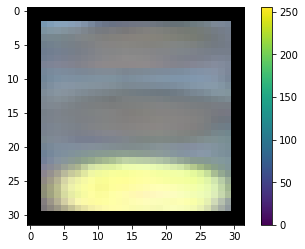

(319, 32, 32, 3)
(158, 32, 32, 3)
319
158


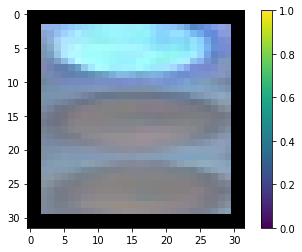

2


In [0]:
from sklearn.model_selection import train_test_split
X = []
Y = []

for feature,label in training_data_traffic:
    X.append(feature)
    Y.append(label)
i = 0
j = 0
while j < len(X):
  for i in range(32):
    X[j][0][i] = 0
  for i in range(32):
    X[j][31][i] = 0
  for i in range(32):
    X[j][1][i] = 0
  for i in range(32):
    X[j][30][i] = 0
  for i in range(32):
    X[j][i][0] = 0
  for i in range(32):
    X[j][i][31] = 0
  for i in range(32):
    X[j][i][30] = 0
  for i in range(32):
    X[j][i][1] = 0
  j += 1
plt.figure()
plt.imshow(X[0])
plt.colorbar()
plt.grid(False)
plt.show()
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.33, random_state=seed)
X_train = np.array(X_train).reshape( -1, IMG_SIZE, IMG_SIZE, 3)
X_train = X_train/255.0
X_test = np.array(X_test).reshape(-1,IMG_SIZE, IMG_SIZE, 3)
X_test = X_test/255.0
print(X_train.shape)
print(X_test.shape)
print(len(Y_train))
print(len(Y_test))
plt.figure()
plt.imshow(X_test[99])
plt.colorbar()
plt.grid(False)
plt.show()
print(Y_test[99])
class_names = ['green', 'yellow', 'red']

In [0]:
print(len(Y))

477


In [0]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.optimizers import SGD
new_kmodel = Sequential()
new_kmodel.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(32, 32, 3)))
new_kmodel.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
new_kmodel.add(MaxPooling2D((2, 2)))
new_kmodel.add(Flatten())
new_kmodel.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
new_kmodel.add(Dense(3, activation = 'softmax'))
# compile model
opt = SGD(lr=0.001, momentum=0.9)
new_kmodel.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
new_kmodel.fit(X_train, Y_train,batch_size=50,epochs=3, validation_split = 0.3)
new_kmodel.evaluate(X_test, Y_test)

Using TensorFlow backend.








Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where



Train on 223 samples, validate on 96 samples
Epoch 1/3





223/223 [==============================] - 2s 7ms/step - loss: 1.0185 - acc: 0.5381 - val_loss: 0.3758 - val_acc: 0.7604
Epoch 2/3
223/223 [==============================] - 1s 2ms/step - loss: 0.2510 - acc: 0.9103 - val_loss: 0.0477 - val_acc: 1.0000
Epoch 3/3
158/158 [==============================] - 0s 500us/step


[0.010099479645679268, 1.0]

In [0]:
from sklearn.model_selection import StratifiedKFold
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.optimizers import SGD
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)
results_list = []
X = np.array(X) / 255.0
for train, test in kfold.split(X, Y):
  test_model = Sequential()
  test_model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(32, 32, 3)))
  test_model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
  test_model.add(MaxPooling2D((2, 2)))
  test_model.add(Flatten())
  test_model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
  test_model.add(Dense(3, activation = 'softmax'))
# compile model
  opt = SGD(lr=0.001, momentum=0.9)
  test_model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  test_model.fit(X[train], np.array(Y)[train], epochs=3, batch_size=50)
  results = test_model.evaluate(X[test], np.array(Y)[test])
  results_list.append(results[1] * 100)


Epoch 1/3
428/428 [==============================] - 1s 3ms/step - loss: 0.7719 - acc: 0.7407
Epoch 2/3
428/428 [==============================] - 1s 2ms/step - loss: 0.1522 - acc: 1.0000
Epoch 3/3
49/49 [==============================] - 0s 2ms/step
Epoch 1/3
428/428 [==============================] - 1s 3ms/step - loss: 0.9160 - acc: 0.6028
Epoch 2/3
428/428 [==============================] - 1s 2ms/step - loss: 0.1698 - acc: 0.9977
Epoch 3/3
49/49 [==============================] - 0s 2ms/step
Epoch 1/3
428/428 [==============================] - 1s 3ms/step - loss: 0.6809 - acc: 0.8481
Epoch 2/3
428/428 [==============================] - 1s 2ms/step - loss: 0.1031 - acc: 1.0000
Epoch 3/3
49/49 [==============================] - 0s 2ms/step
Epoch 1/3
428/428 [==============================] - 1s 3ms/step - loss: 1.0258 - acc: 0.5864
Epoch 2/3
428/428 [==============================] - 1s 2ms/step - loss: 0.0651 - acc: 0.9836
Epoch 3/3
49/49 [==============================] - 0s 3ms/s

In [0]:
print(np.array(results_list).mean())
print(np.array(results_list).std())

100.0
0.0


In [0]:
def test_array_for_model(array):
  thing = []
  thing.append(array)
  thing = np.array(thing).reshape(-1,32, 32, 3)
  return thing

In [0]:
print(test_array_for_model(X).shape)
count = 0
Adversarial_X = []
Adversarial_Y = []
while count < len(X):
  Adversarial_X.append(X[count])
  count += 1
count1 = 0
while count1 < len(Y):
  Adversarial_Y.append(Y[count1])
  count1 += 1
X = test_array_for_model(X) 
Adversarial_X = test_array_for_model(Adversarial_X)
print(len(Adversarial_X))
print(len(Adversarial_Y))
print(len(Y))

(477, 32, 32, 3)
477
477
477


In [0]:
import foolbox
from foolbox.attacks import SpatialAttack
untargeted_images = []
untargeted_labels = []
fmodel = foolbox.models.KerasModel(new_kmodel, bounds=(0, 1), preprocessing=(0,1))
attack = foolbox.attacks.SpatialAttack(fmodel)
adversarial = attack(test_array_for_model(X), np.array(Y), x_shift_limits = (-3,3), y_shift_limits = (-3,3))
print(adversarial[0][0][0][0])

0.4638947880766655


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:95: UserWarning: SpatialAttack did not find an adversarial, maybe the model or the criterion is not supported by this attack.
  " attack.".format(self.name())


In [0]:
print(len(Y))

477


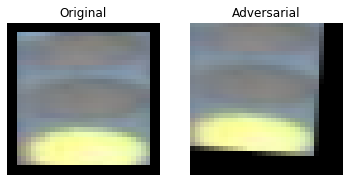

0


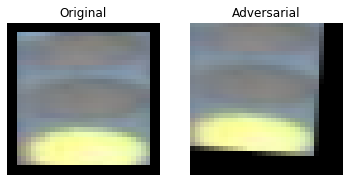

0


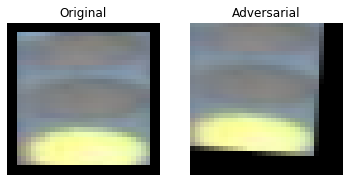

0


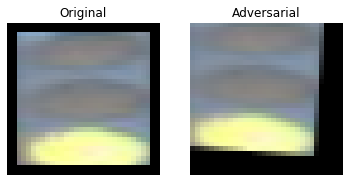

0


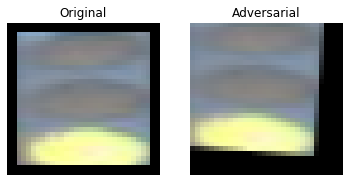

0


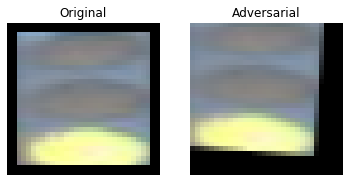

0


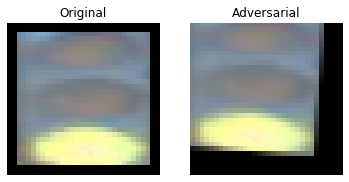

0


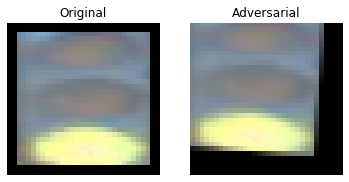

0


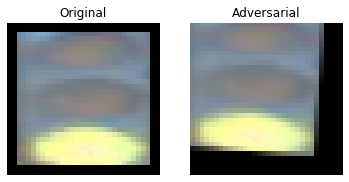

0


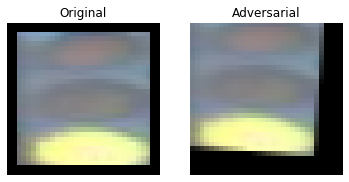

0


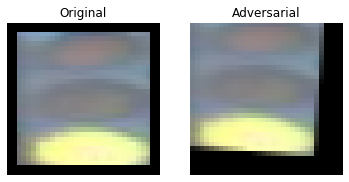

0


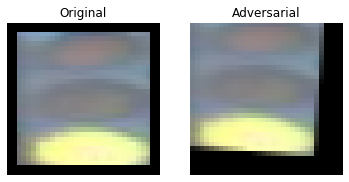

0


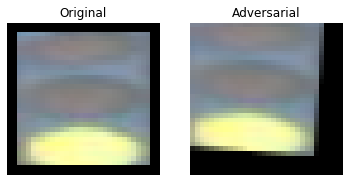

0


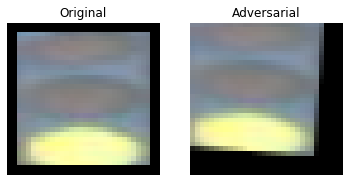

0


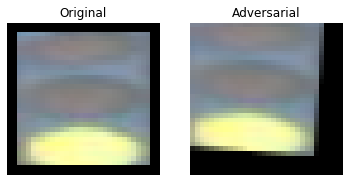

0


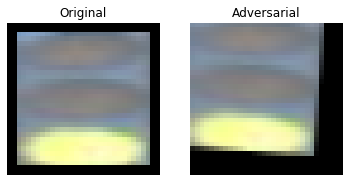

0


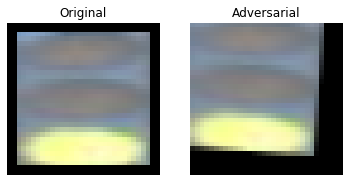

0


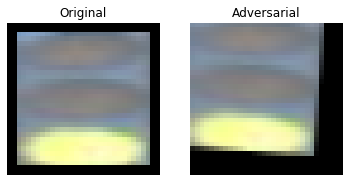

0


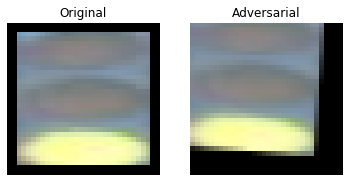

0


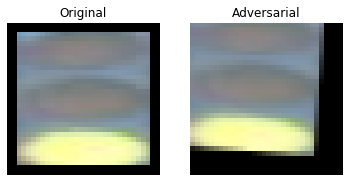

0


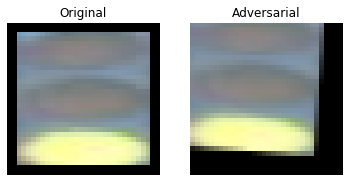

0


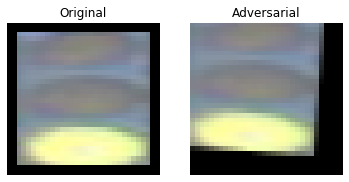

0


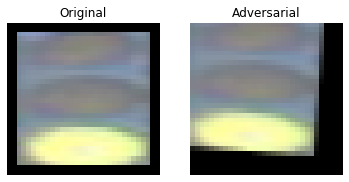

0


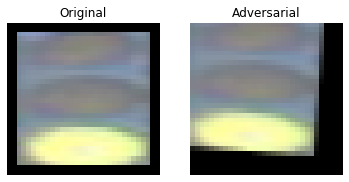

0


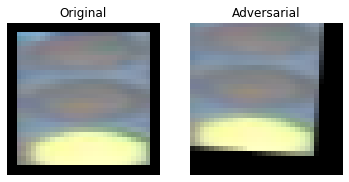

0


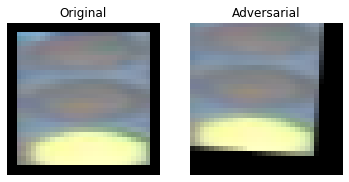

0


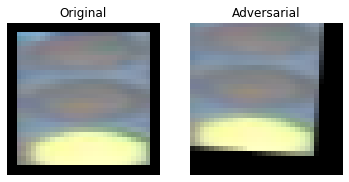

0


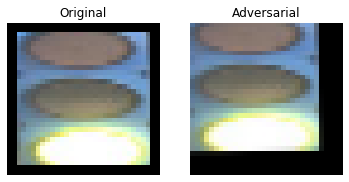

0


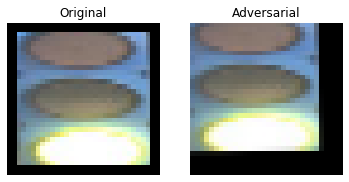

0


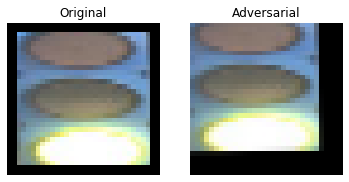

0


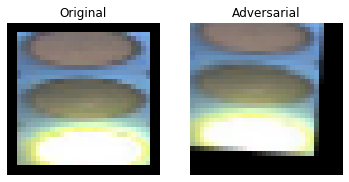

0


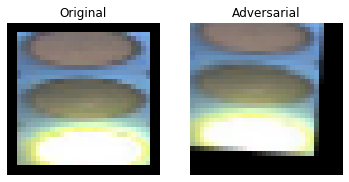

0


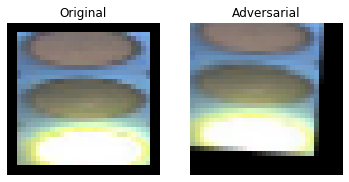

0


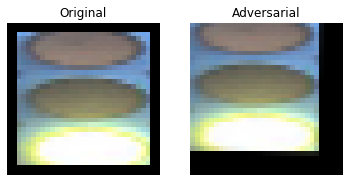

0


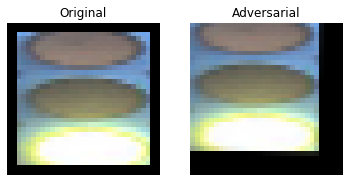

0


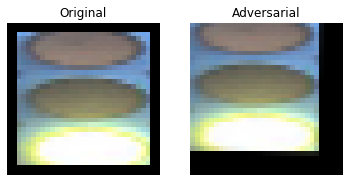

0


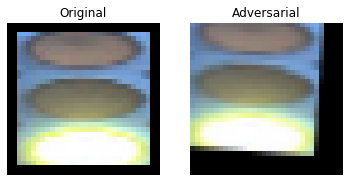

0


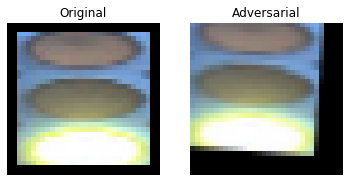

0


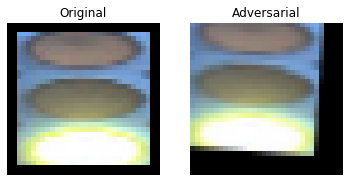

0


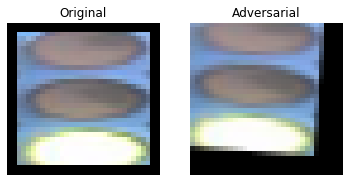

0


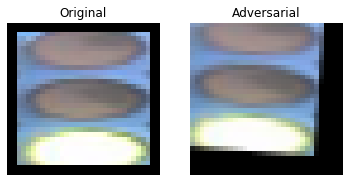

0


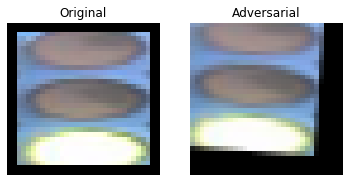

0


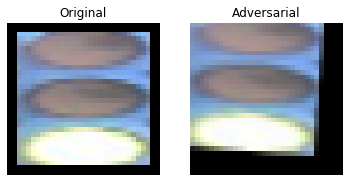

0


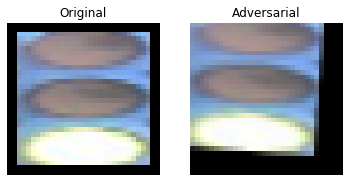

0


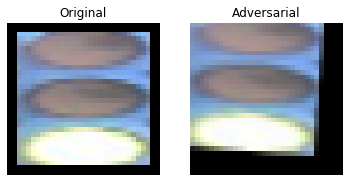

0


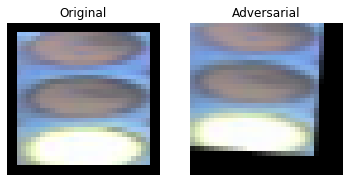

0


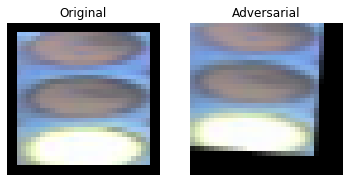

0


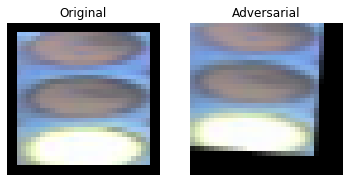

0


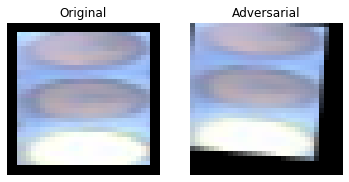

0


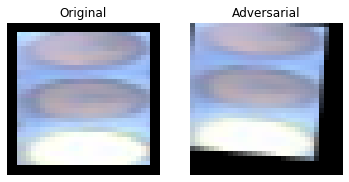

0


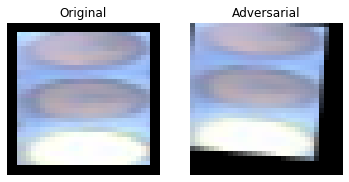

0


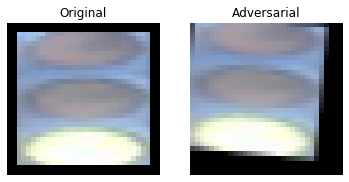

0


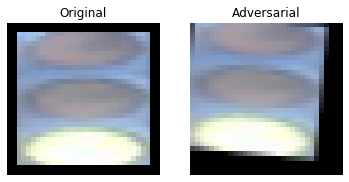

0


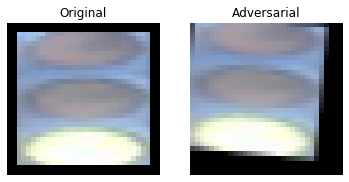

0


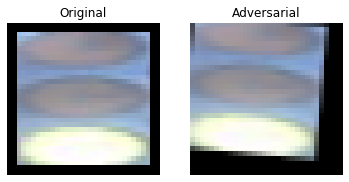

0


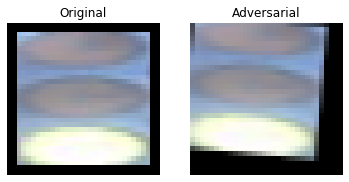

0


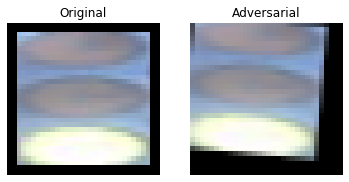

0


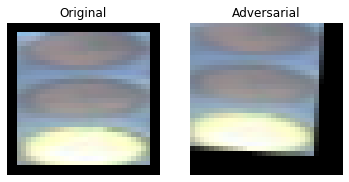

0


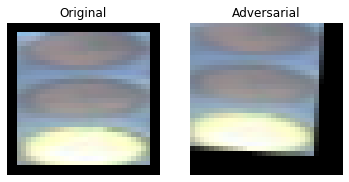

0


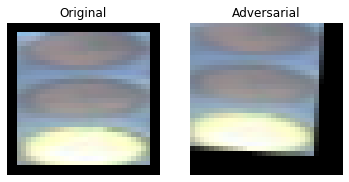

0


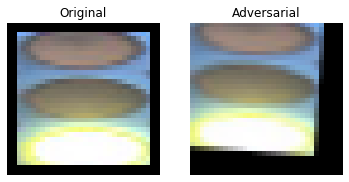

0


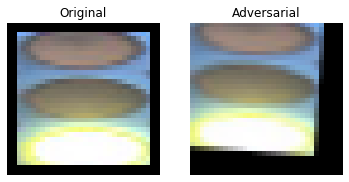

0


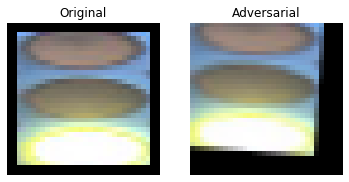

0


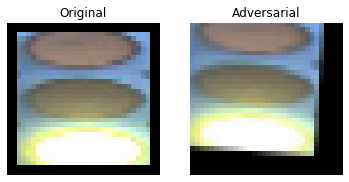

0


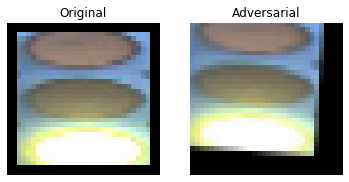

0


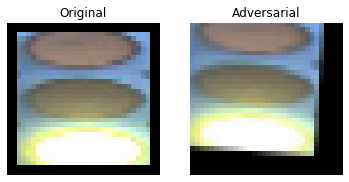

0


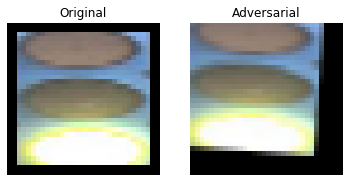

0


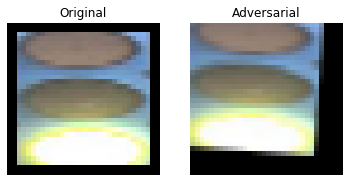

0


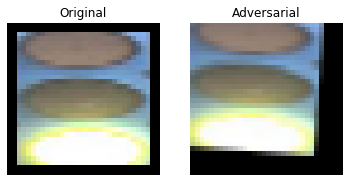

0


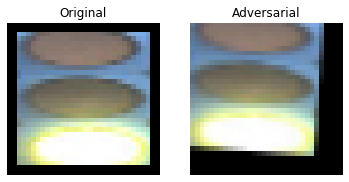

0


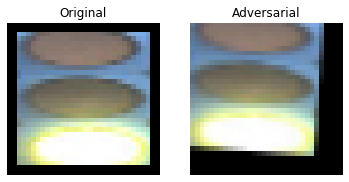

0


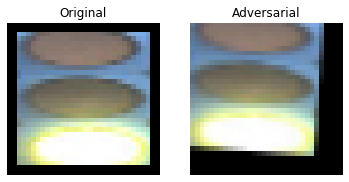

0


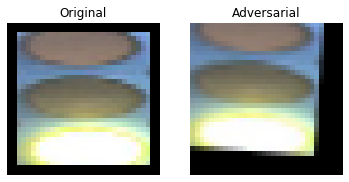

0


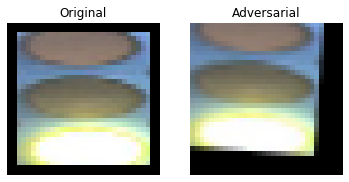

0


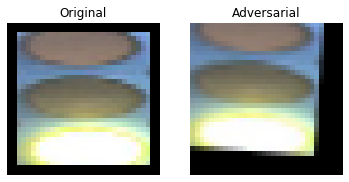

0


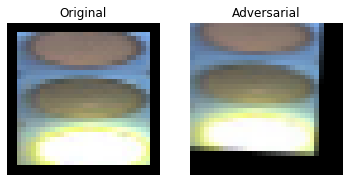

0


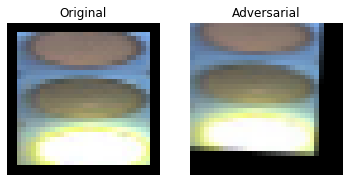

0


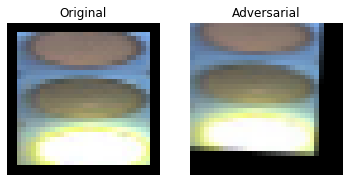

0


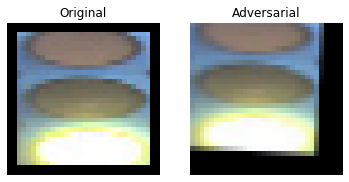

0


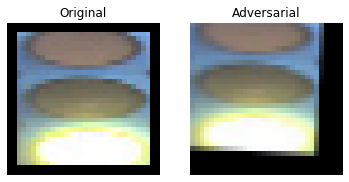

0


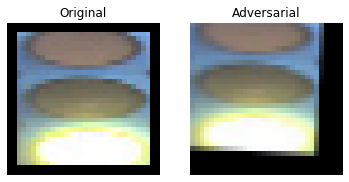

0


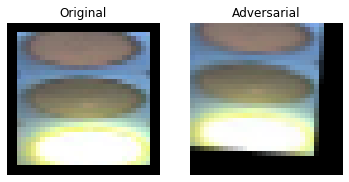

0


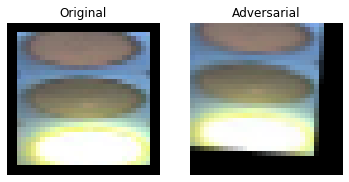

0


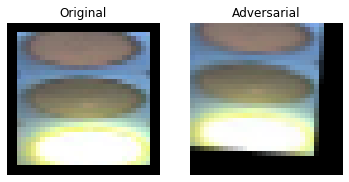

0


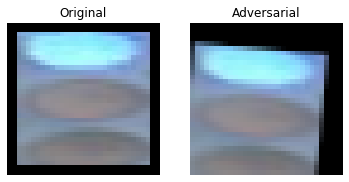

2


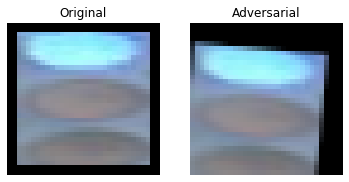

2


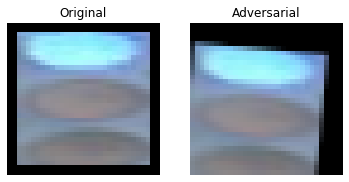

2


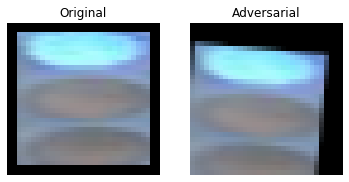

2


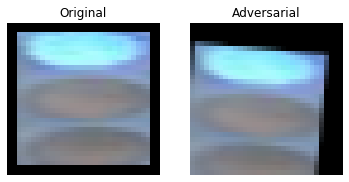

2


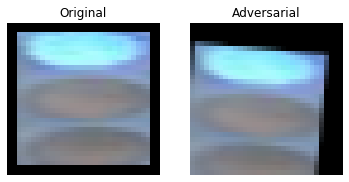

2


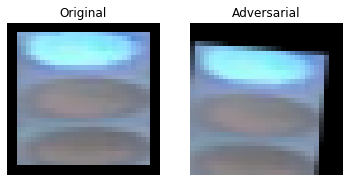

2


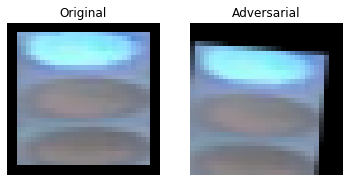

2


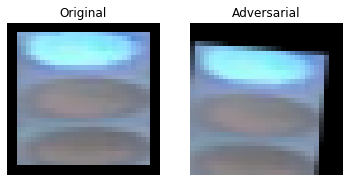

2


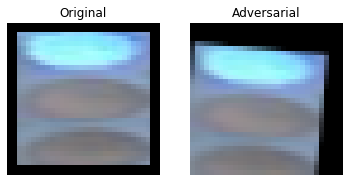

2


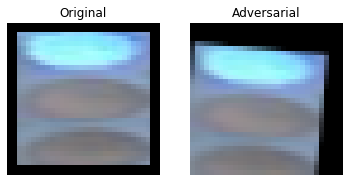

2


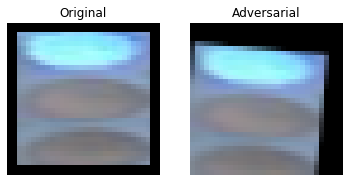

2


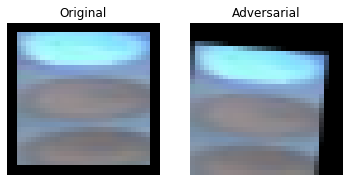

2


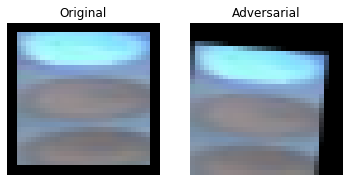

2


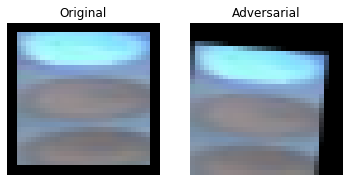

2


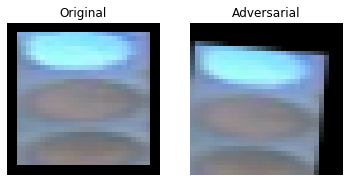

2


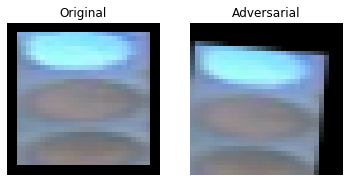

2


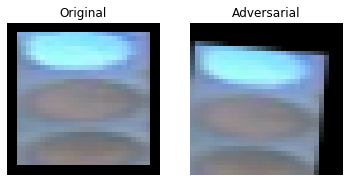

2


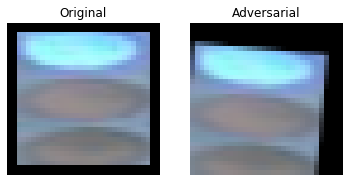

2


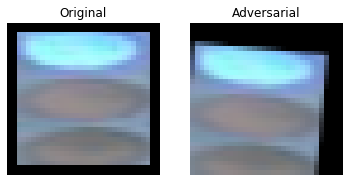

2


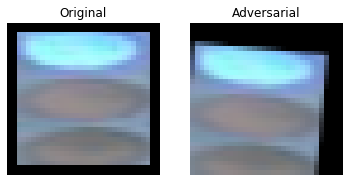

2


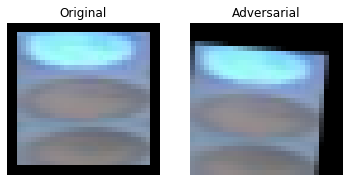

2


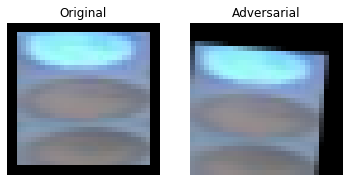

2


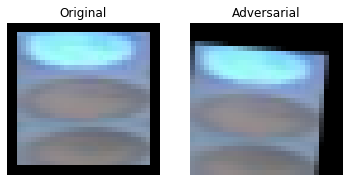

2


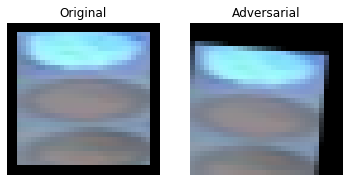

2


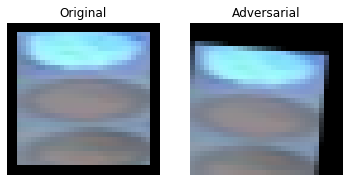

2


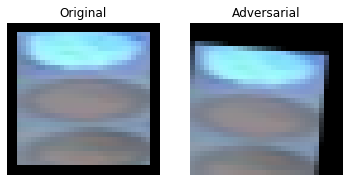

2


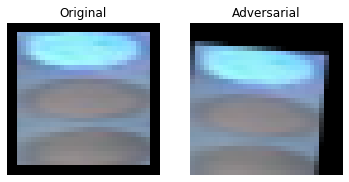

2


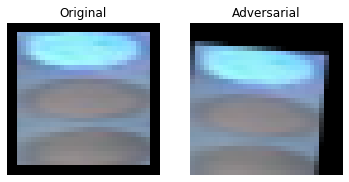

2


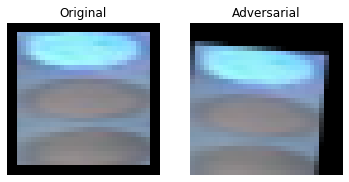

2


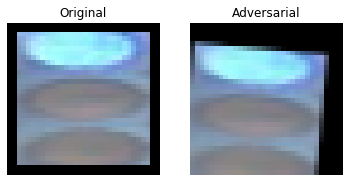

2


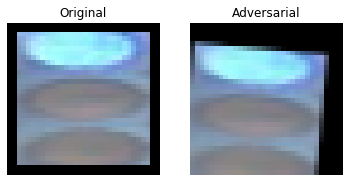

2


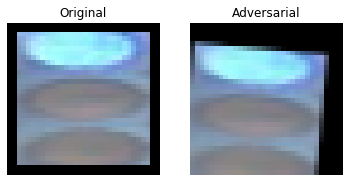

2


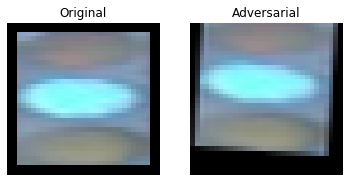

1


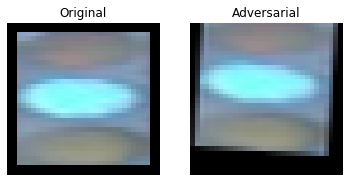

1


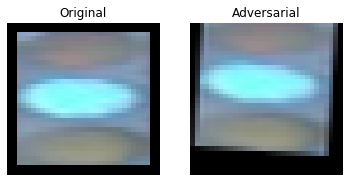

1


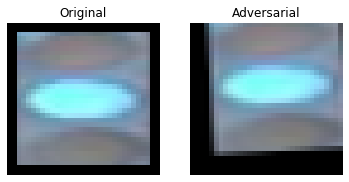

1


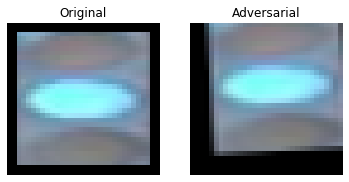

1


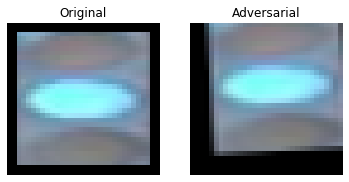

1


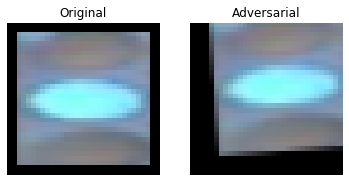

1


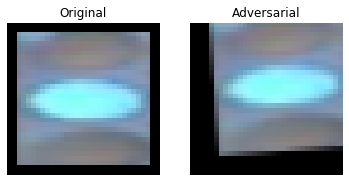

1


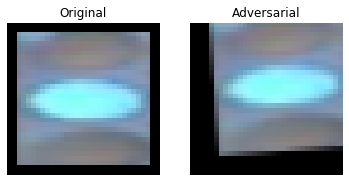

1


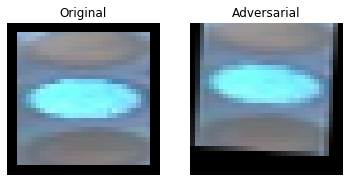

1


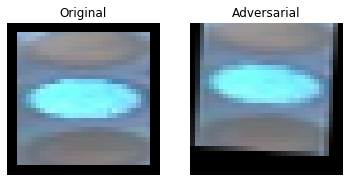

1


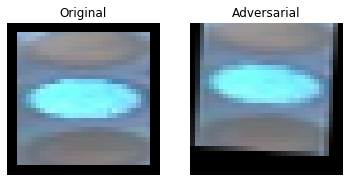

1


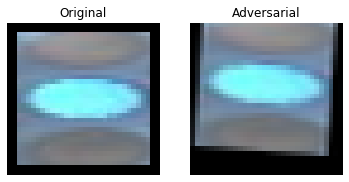

1


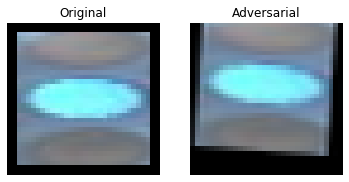

1


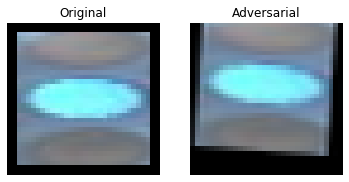

1


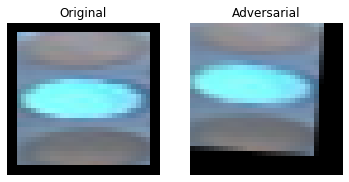

1


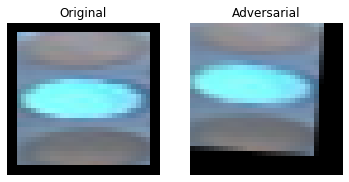

1


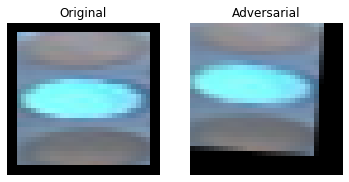

1


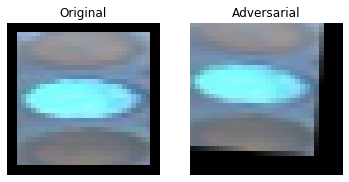

1


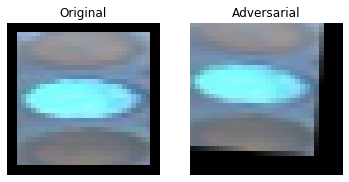

1


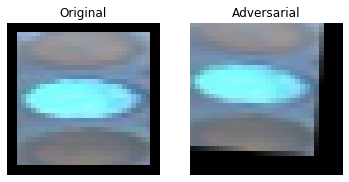

1


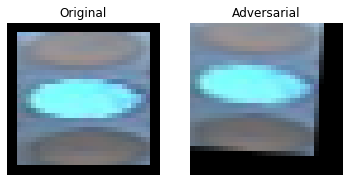

1


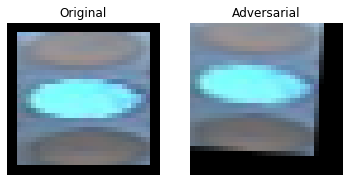

1


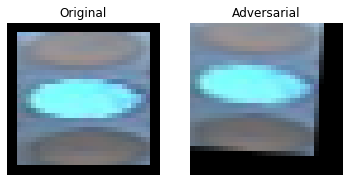

1


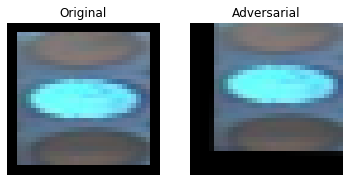

1


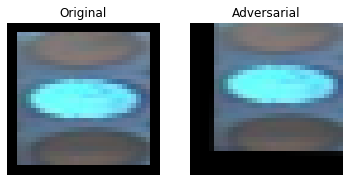

1


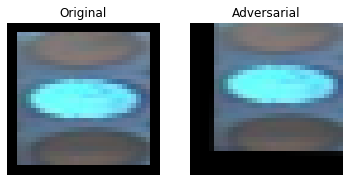

1


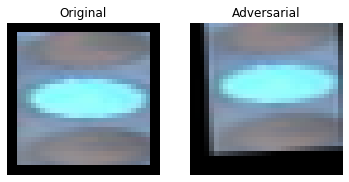

1


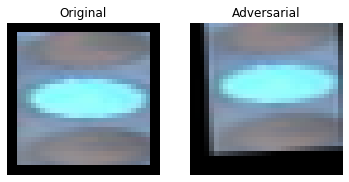

1


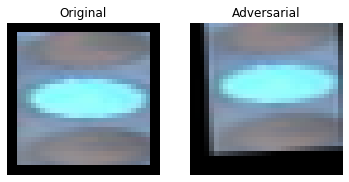

1


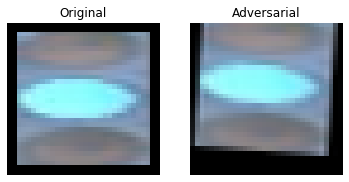

1


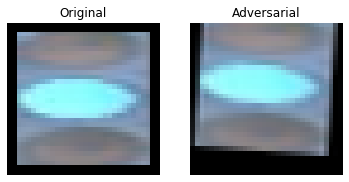

1


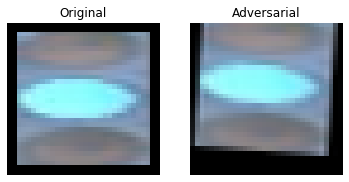

1


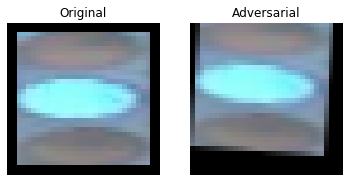

1


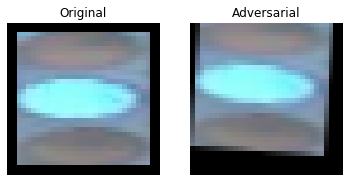

1


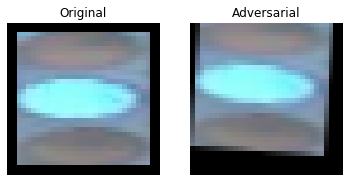

1


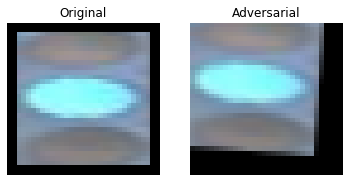

1


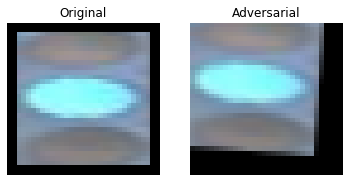

1


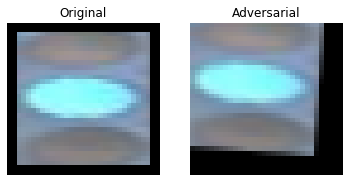

1


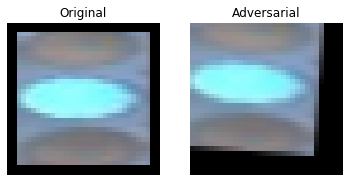

1


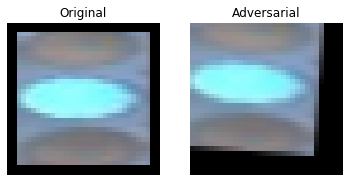

1


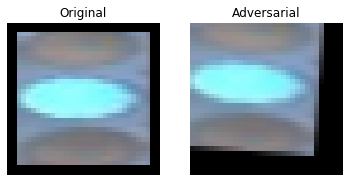

1


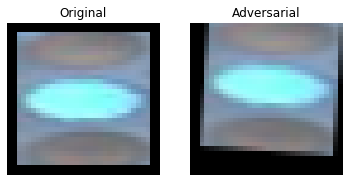

1


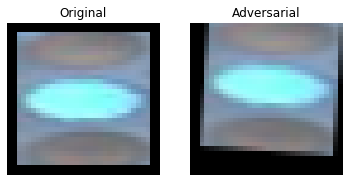

1


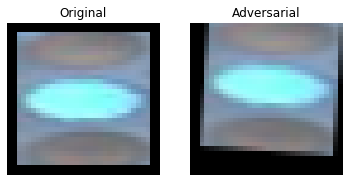

1


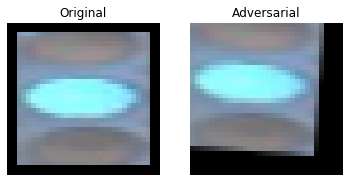

1


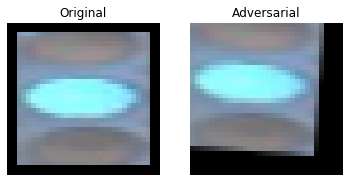

1


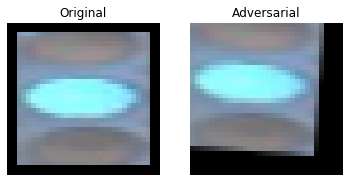

1


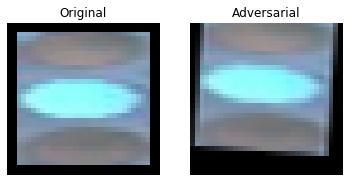

1


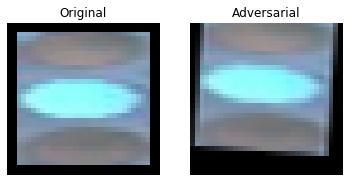

1


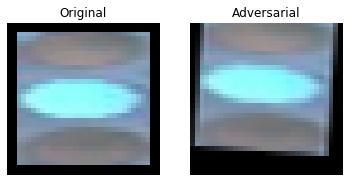

1


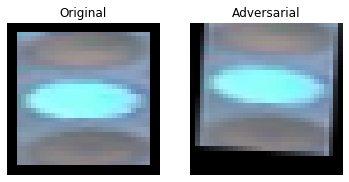

1


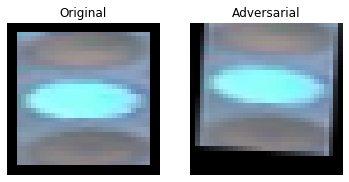

1


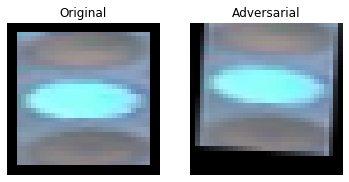

1


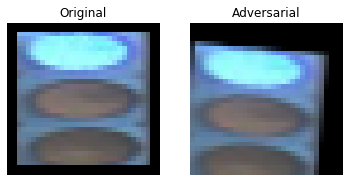

2


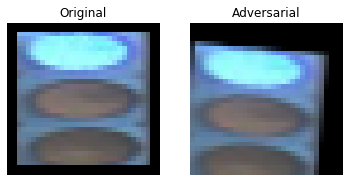

2


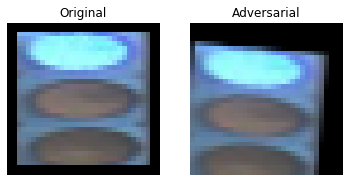

2


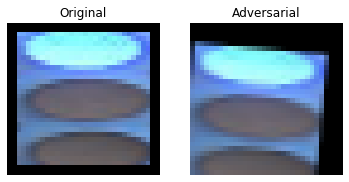

2


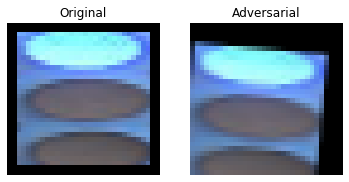

2


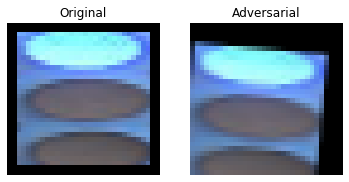

2


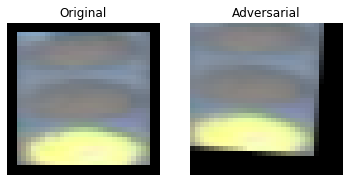

0


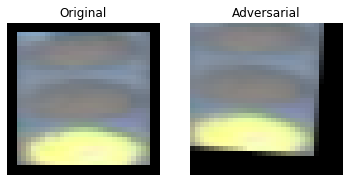

0


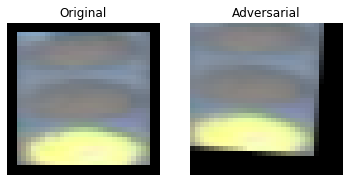

0


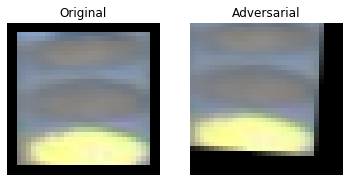

0


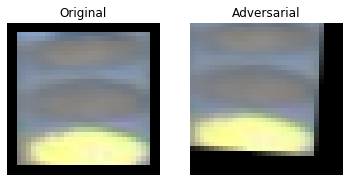

0


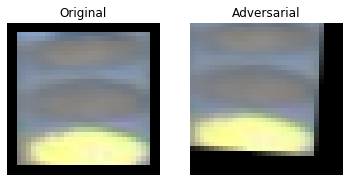

0


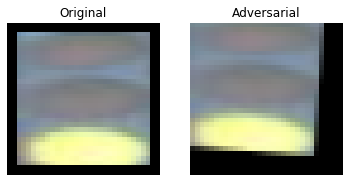

0


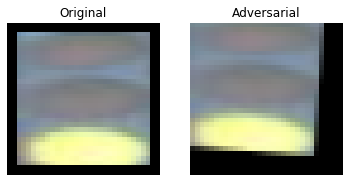

0


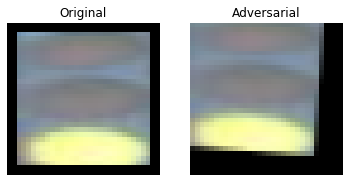

0


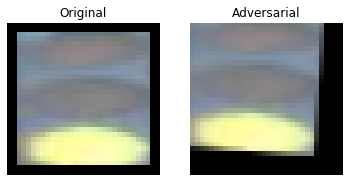

0


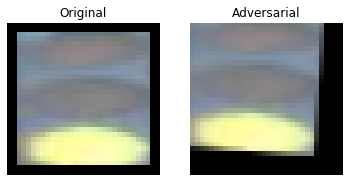

0


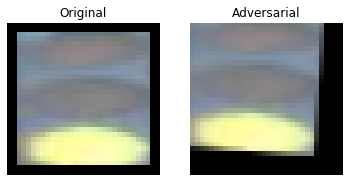

0


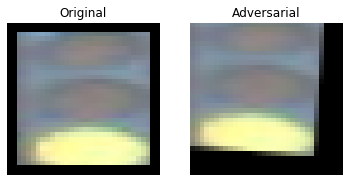

0


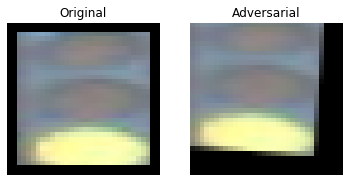

0


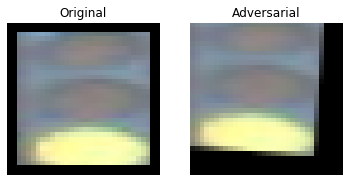

0


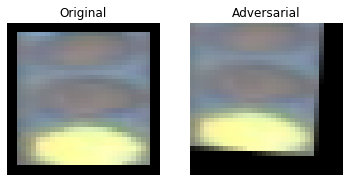

0


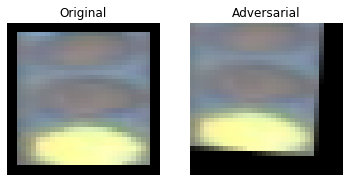

0


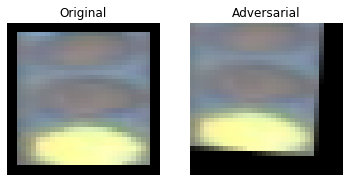

0


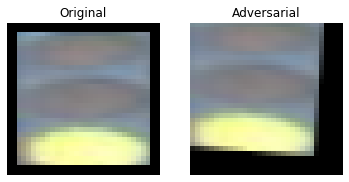

0


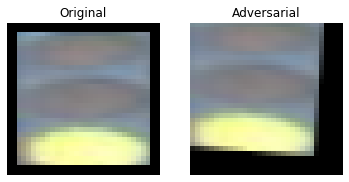

0


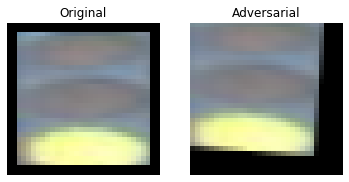

0


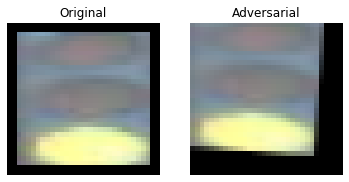

0


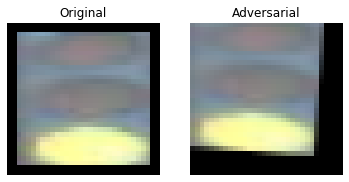

0


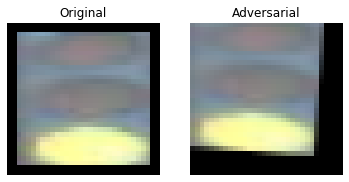

0


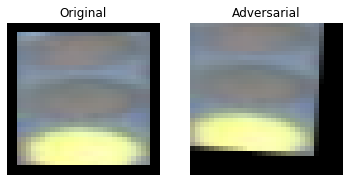

0


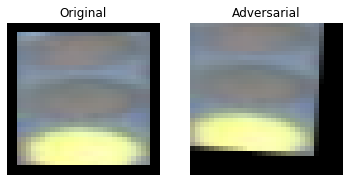

0


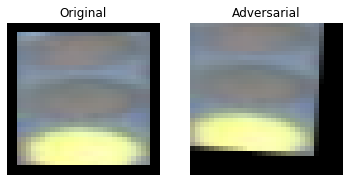

0


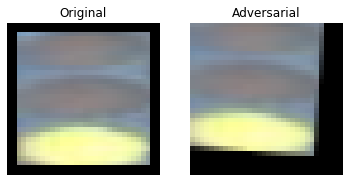

0


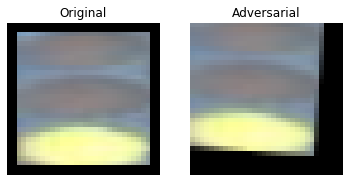

0


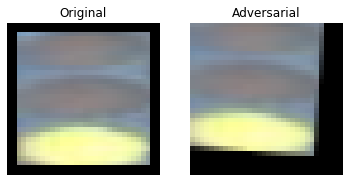

0


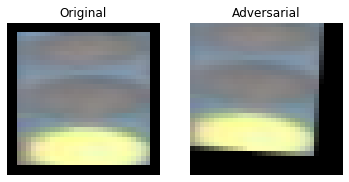

0


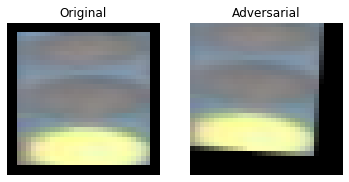

0


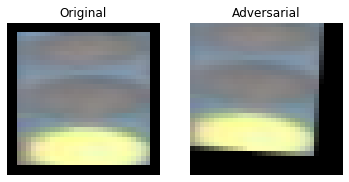

0


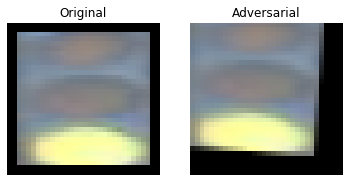

0


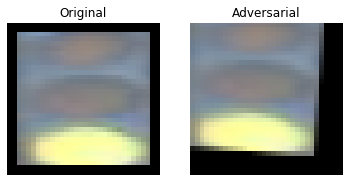

0


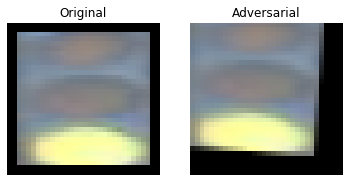

0


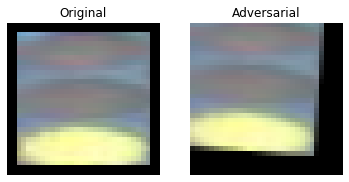

0


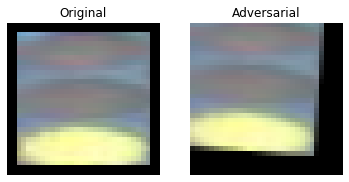

0


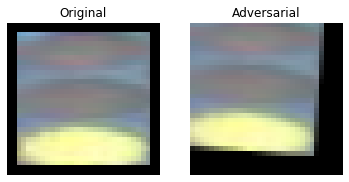

0


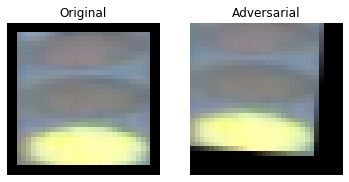

0


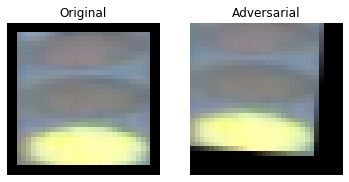

0


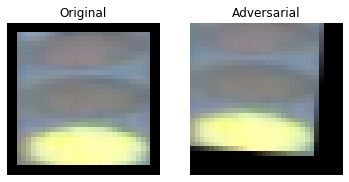

0


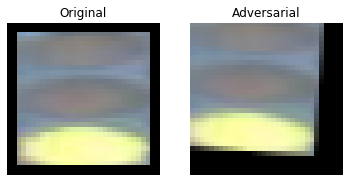

0


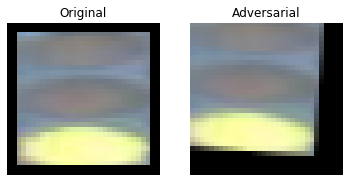

0


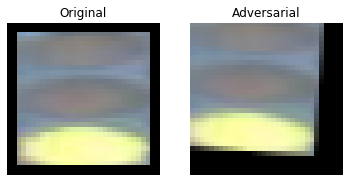

0


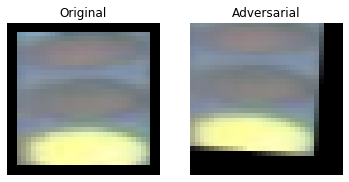

0


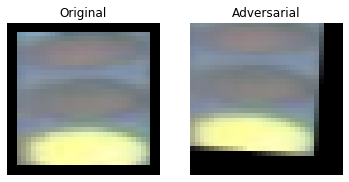

0


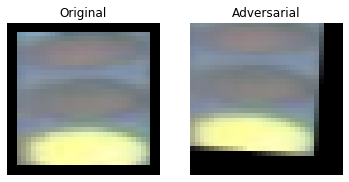

0


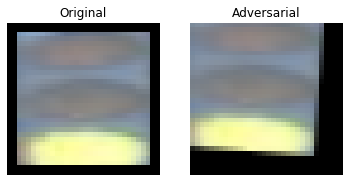

0


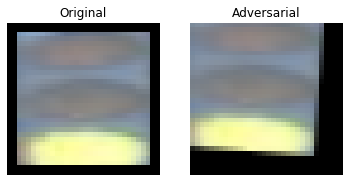

0


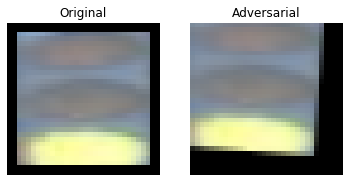

0


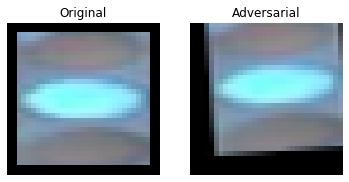

1


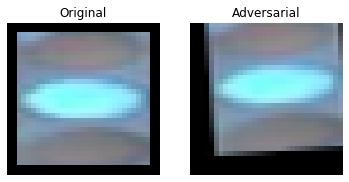

1


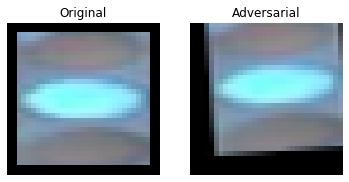

1


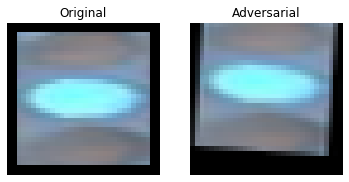

1


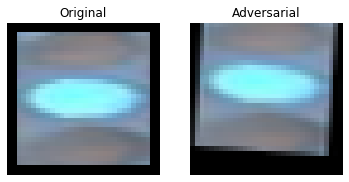

1


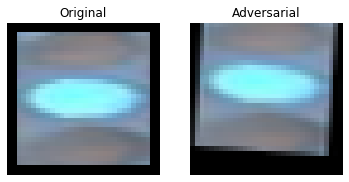

1


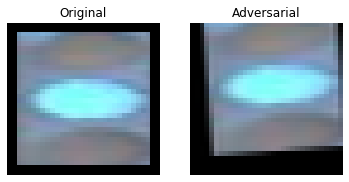

1


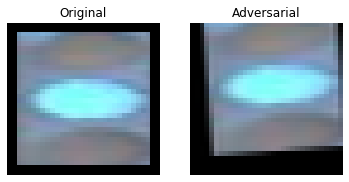

1


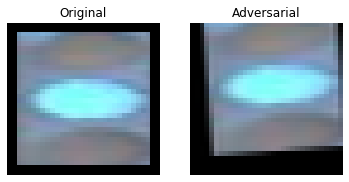

1


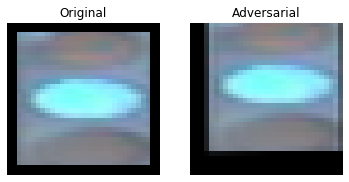

1


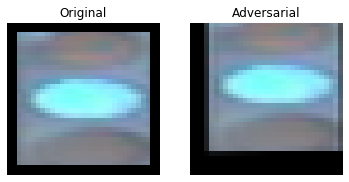

1


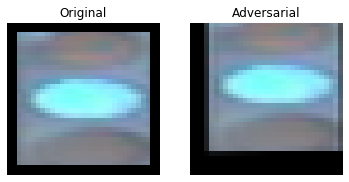

1


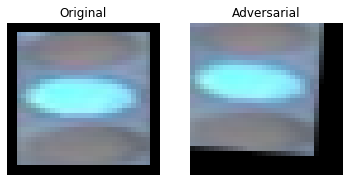

1


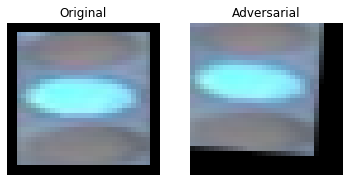

1


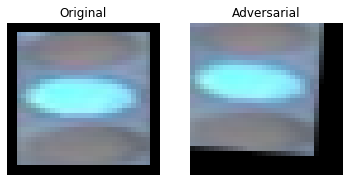

1


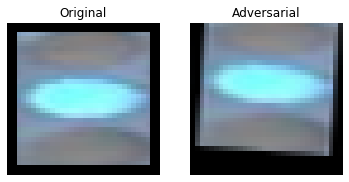

1


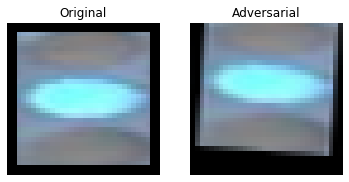

1


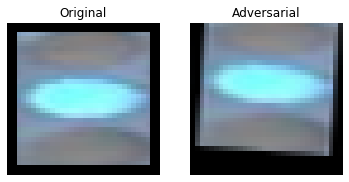

1


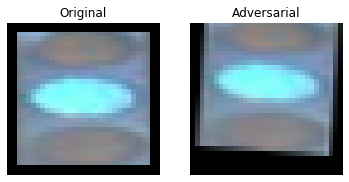

1


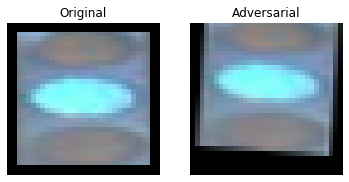

1


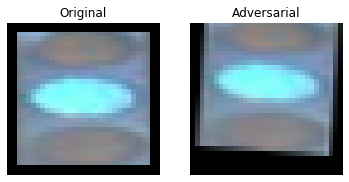

1


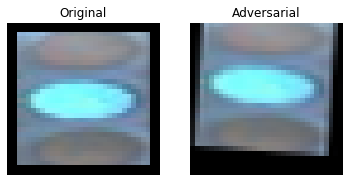

1


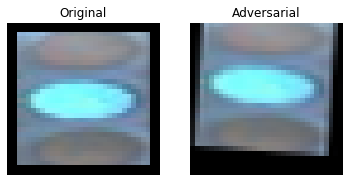

1


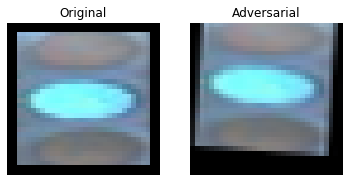

1


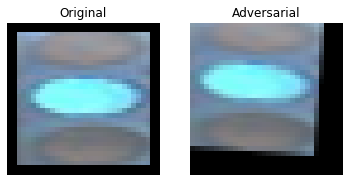

1


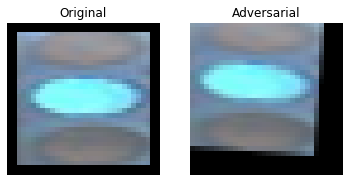

1


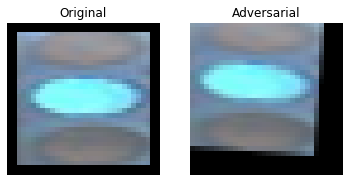

1


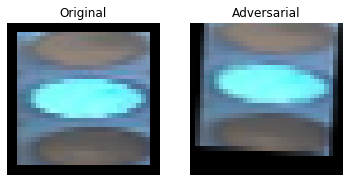

1


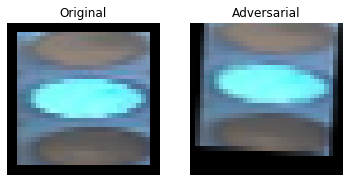

1


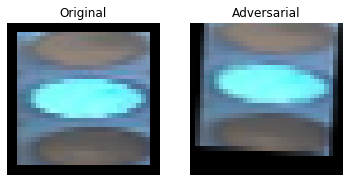

1
735
735


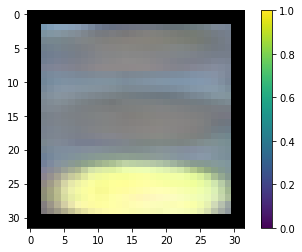

In [0]:
k = 0
Adversarial_X = Adversarial_X.tolist()
while k < len(adversarial):
  if np.isnan(adversarial[k][0][0][0]) == False:
    Adversarial_X.append(adversarial[k])
    Adversarial_Y.append(Y[k])
    plt.figure()

    plt.subplot(1, 2, 1)
    plt.title('Original')
    plt.imshow(X[k])  # division by 255 to convert [0, 255] to [0, 1]
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Adversarial')
    plt.imshow(adversarial[k])  # ::-1 to convert BGR to RGB
    plt.axis('off')


    plt.show()
    print(Y[k])
  k += 1
print(len(Adversarial_X))
print(len(Adversarial_Y))
plt.figure()
plt.imshow(Adversarial_X[0])
plt.colorbar()
plt.grid(False)
plt.show()

In [0]:
import foolbox
from foolbox.attacks import CarliniWagnerL2Attack
from foolbox.criteria import TargetClassProbability
attack = foolbox.attacks.CarliniWagnerL2Attack(fmodel)
adversarial2 = attack(test_array_for_model(X), np.array(Y))

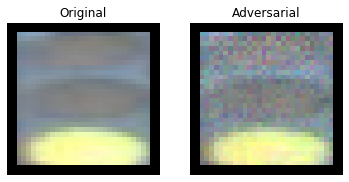

0


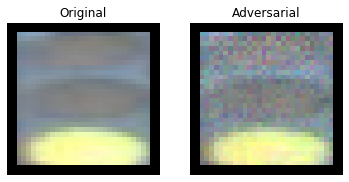

0


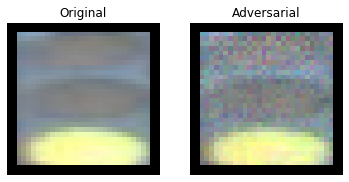

0


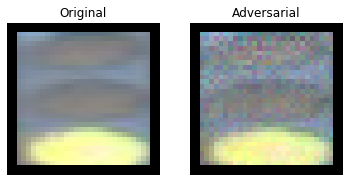

0


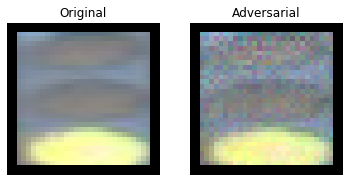

0


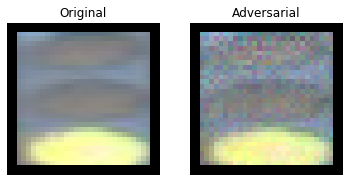

0


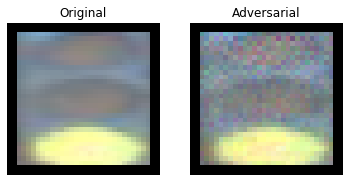

0


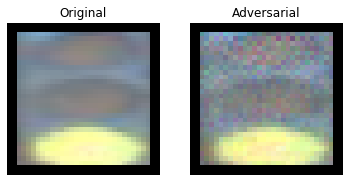

0


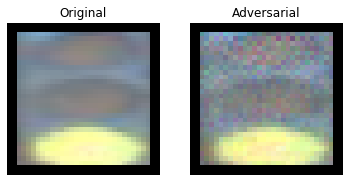

0


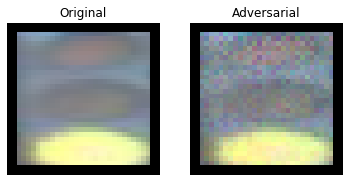

0


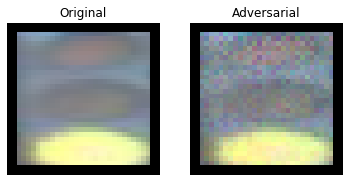

0


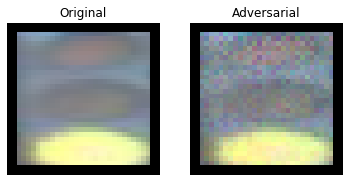

0


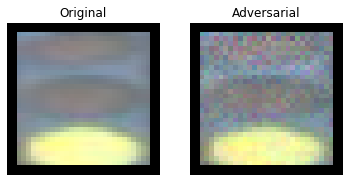

0


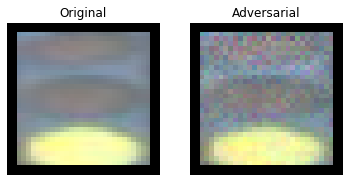

0


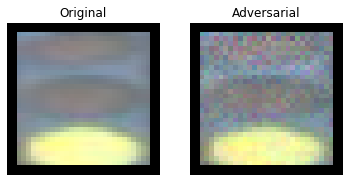

0


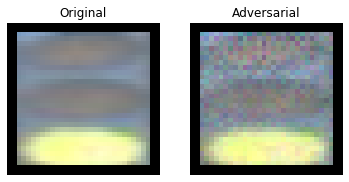

0


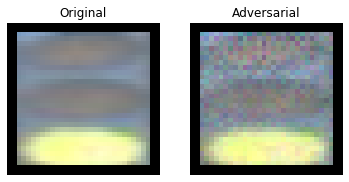

0


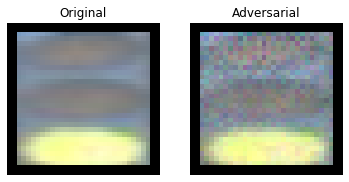

0


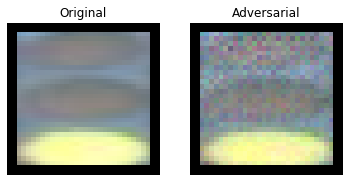

0


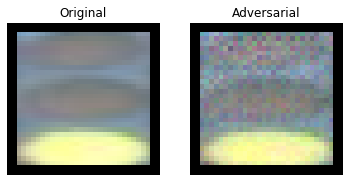

0


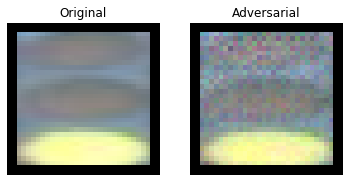

0


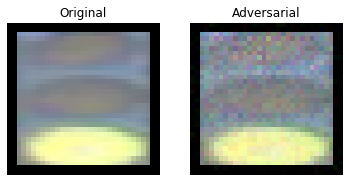

0


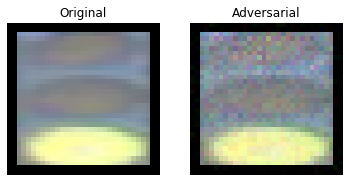

0


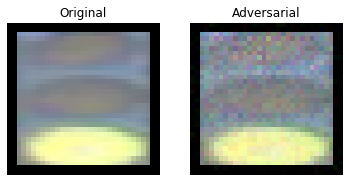

0


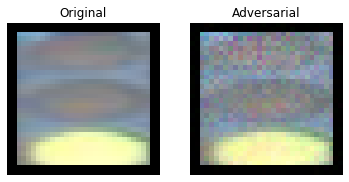

0


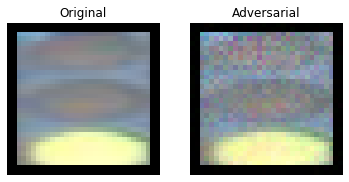

0


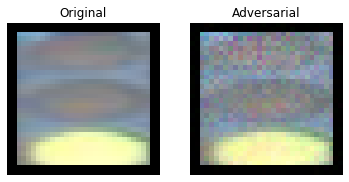

0


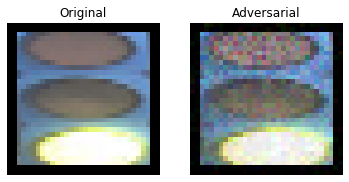

0


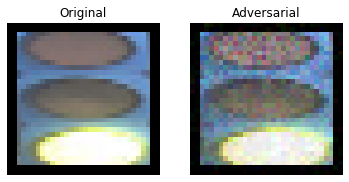

0


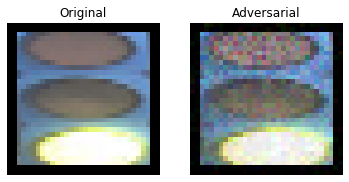

0


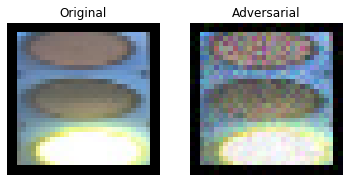

0


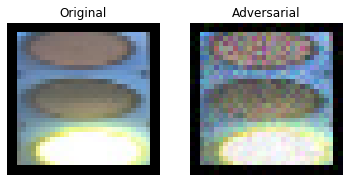

0


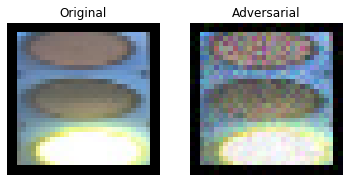

0


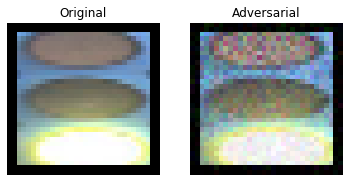

0


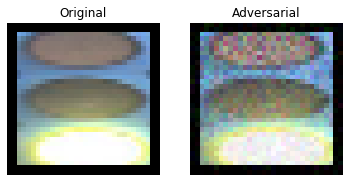

0


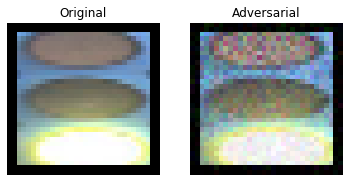

0


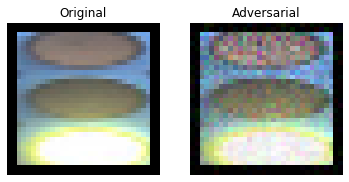

0


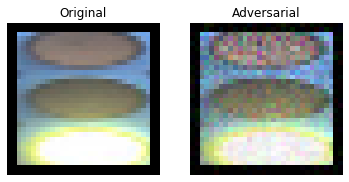

0


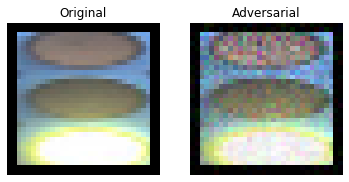

0


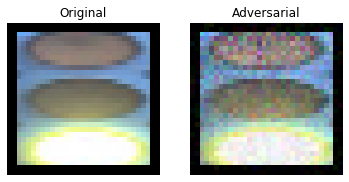

0


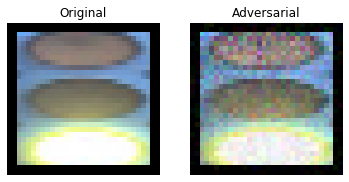

0


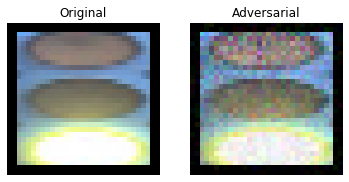

0


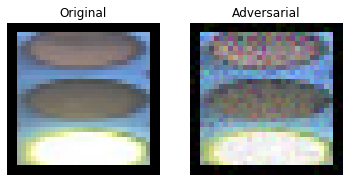

0


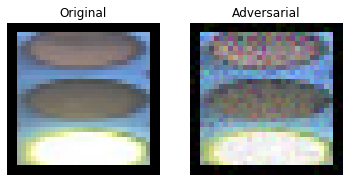

0


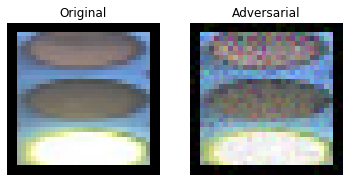

0


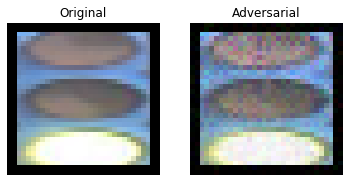

0


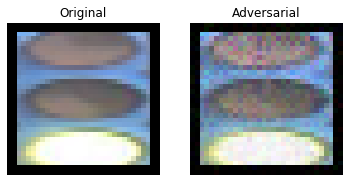

0


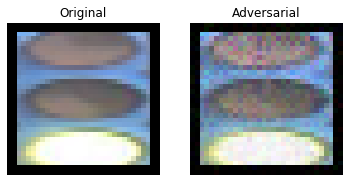

0


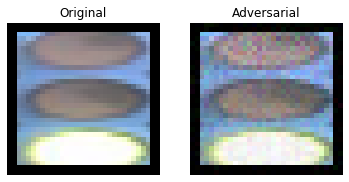

0


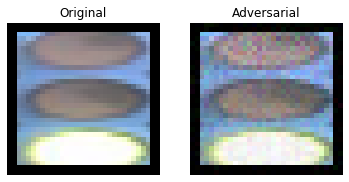

0


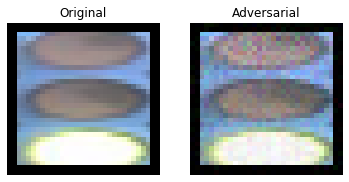

0


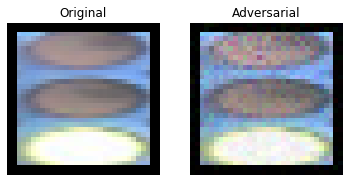

0


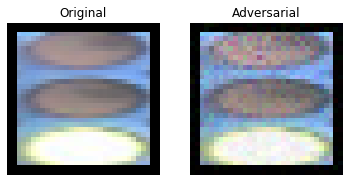

0


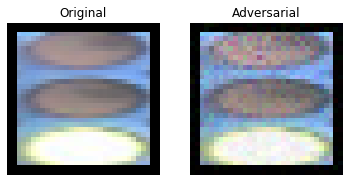

0


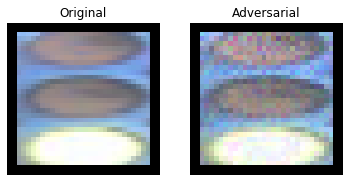

0


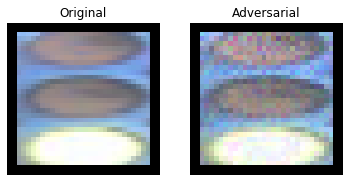

0


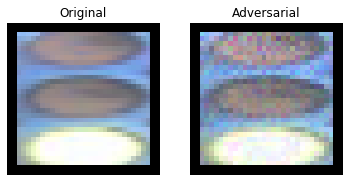

0


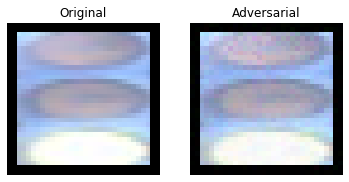

0


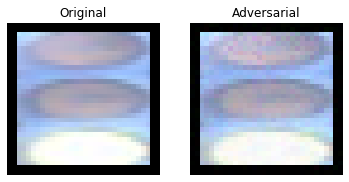

0


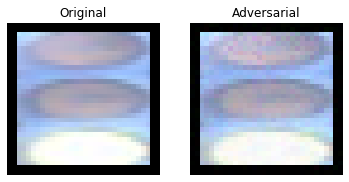

0


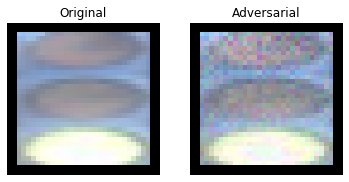

0


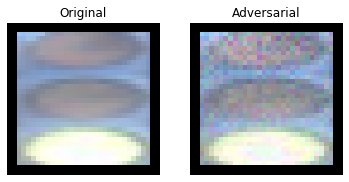

0


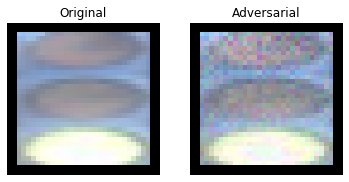

0


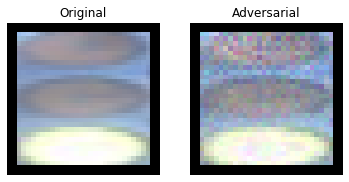

0


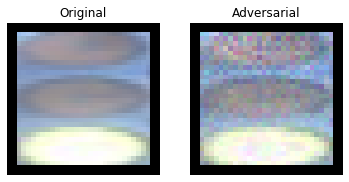

0


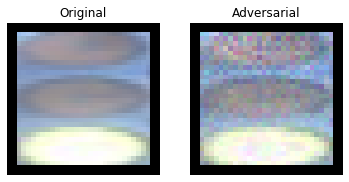

0


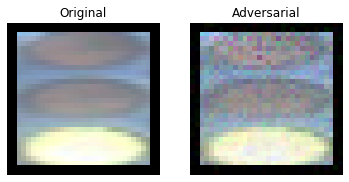

0


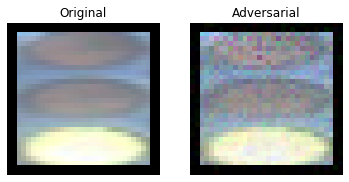

0


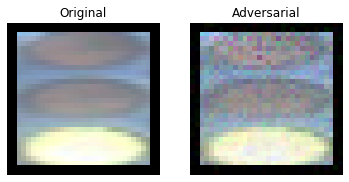

0


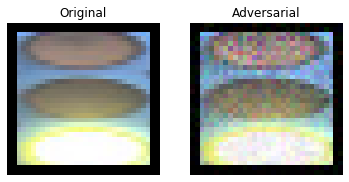

0


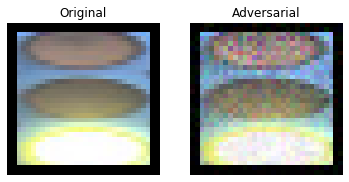

0


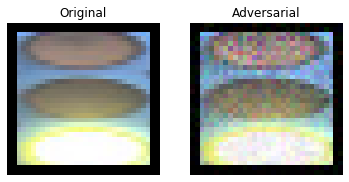

0


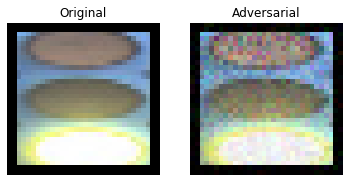

0


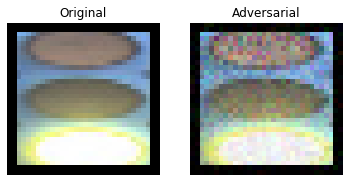

0


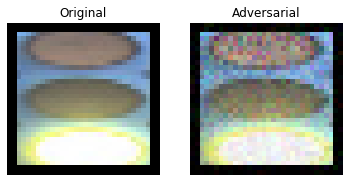

0


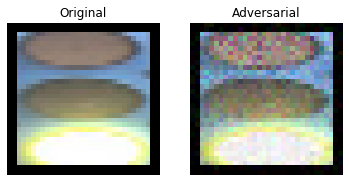

0


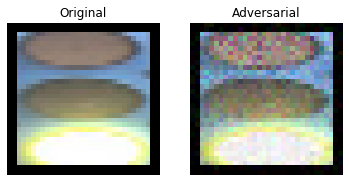

0


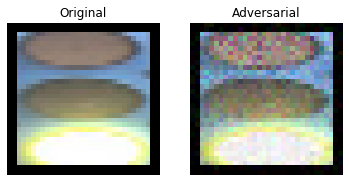

0


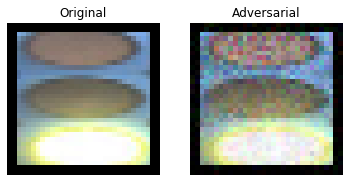

0


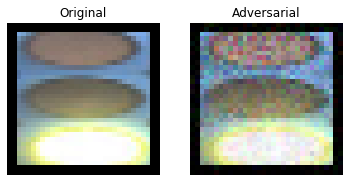

0


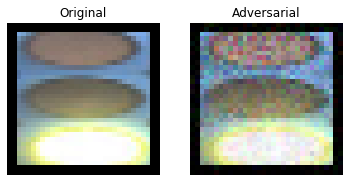

0


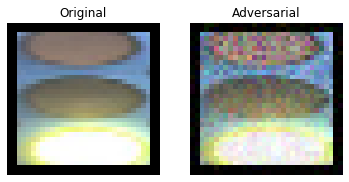

0


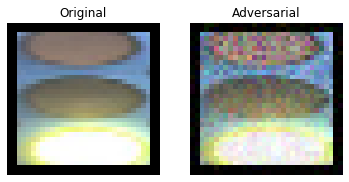

0


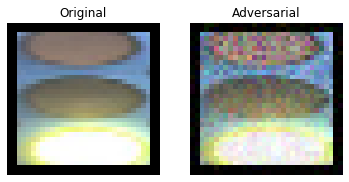

0


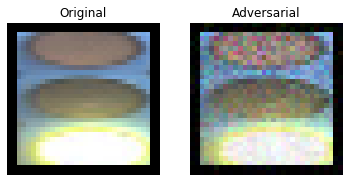

0


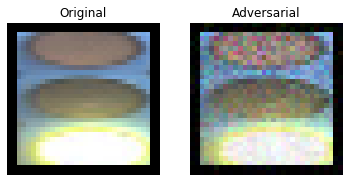

0


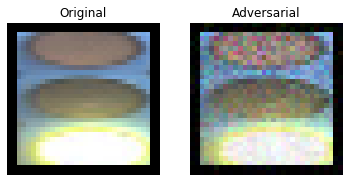

0


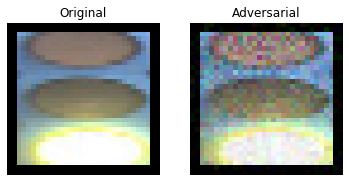

0


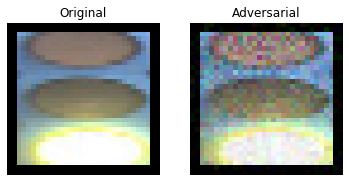

0


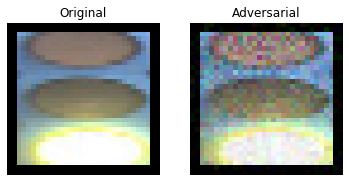

0


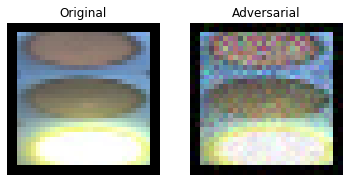

0


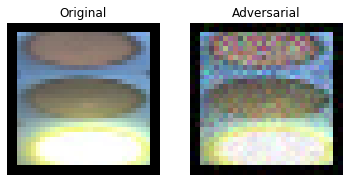

0


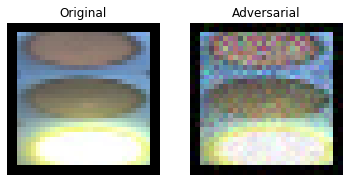

0


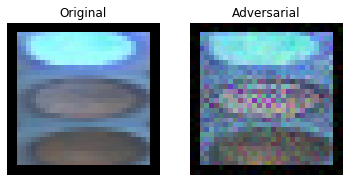

2


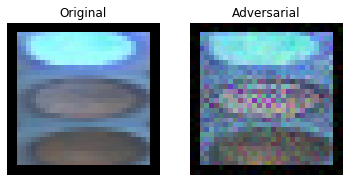

2


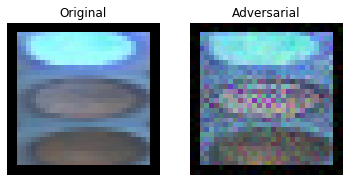

2


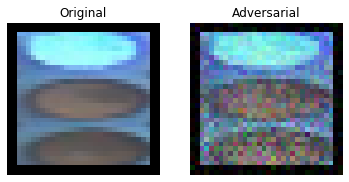

2


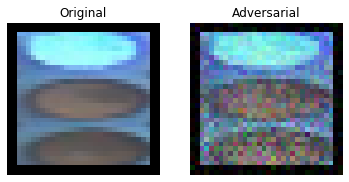

2


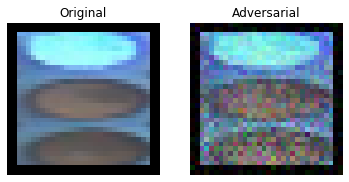

2


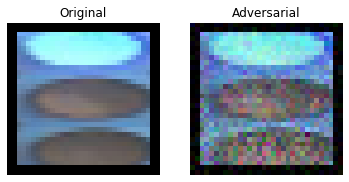

2


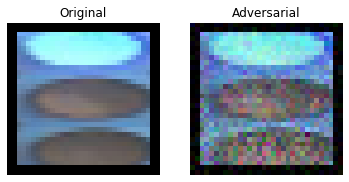

2


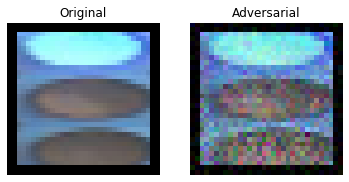

2


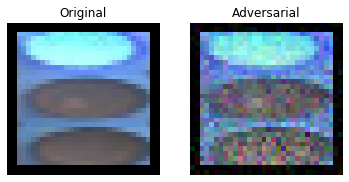

2


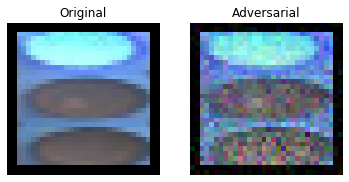

2


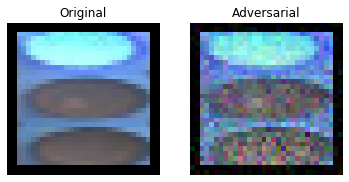

2


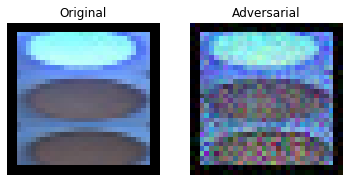

2


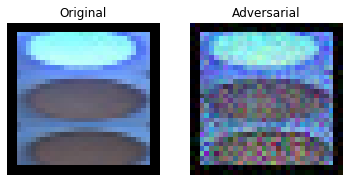

2


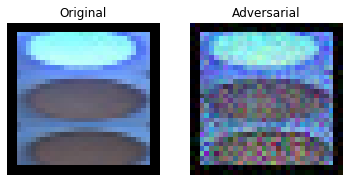

2


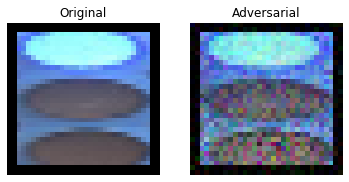

2


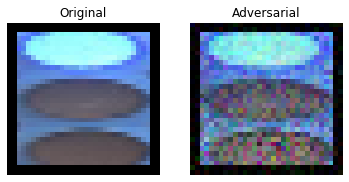

2


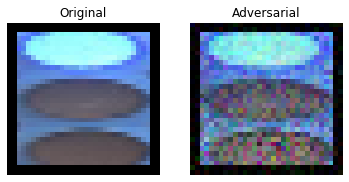

2


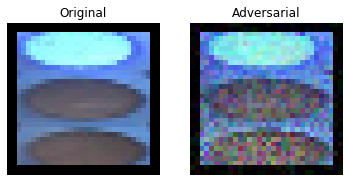

2


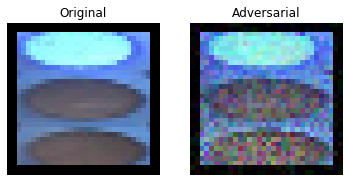

2


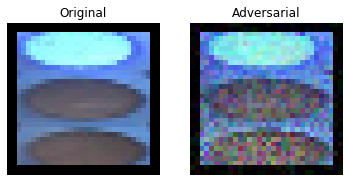

2


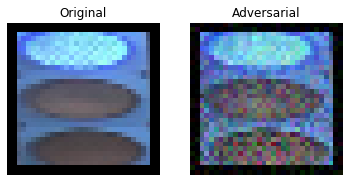

2


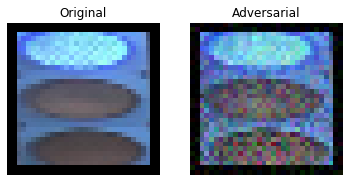

2


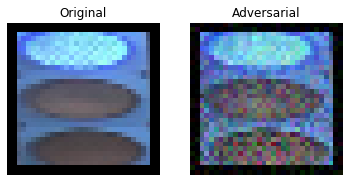

2


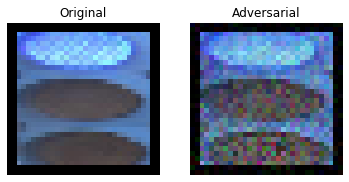

2


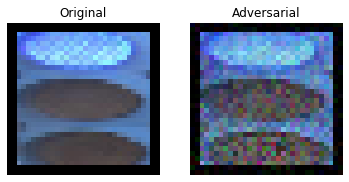

2


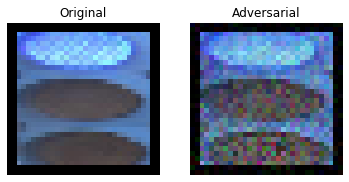

2


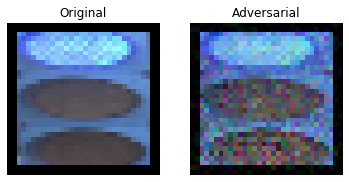

2


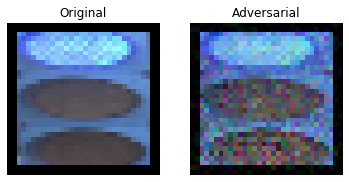

2


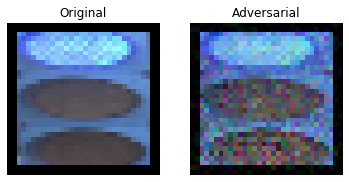

2


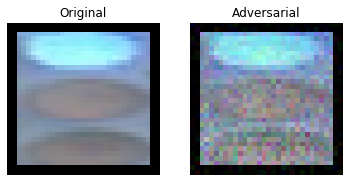

2


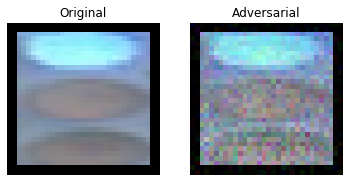

2


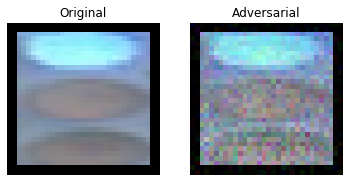

2


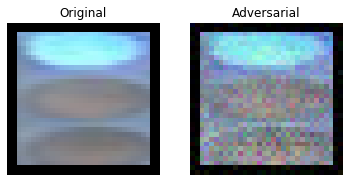

2


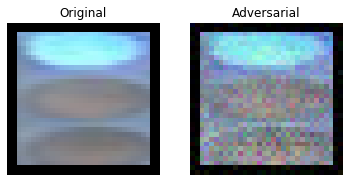

2


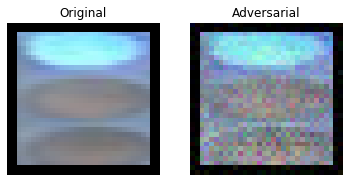

2


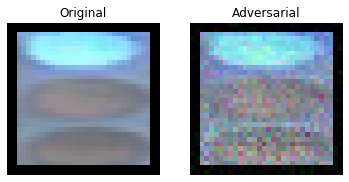

2


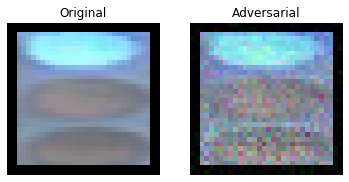

2


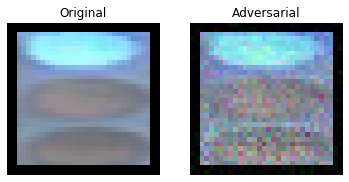

2


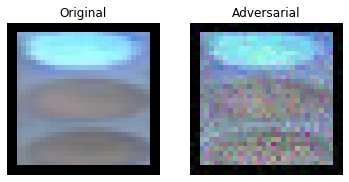

2


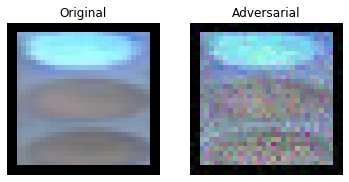

2


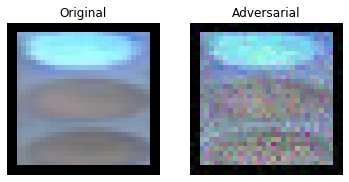

2


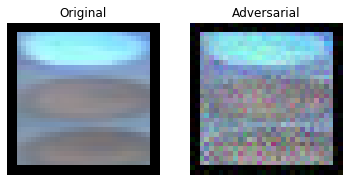

2


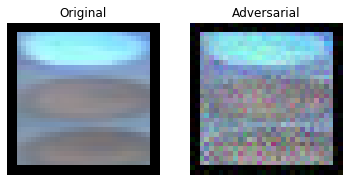

2


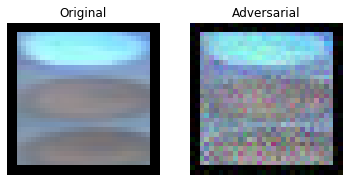

2


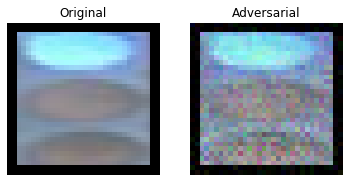

2


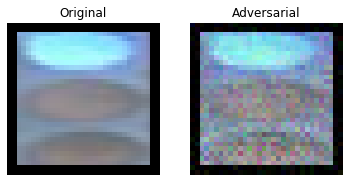

2


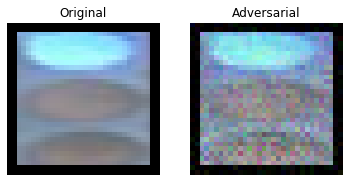

2


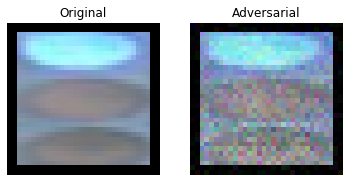

2


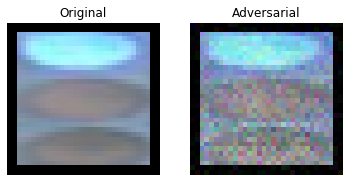

2


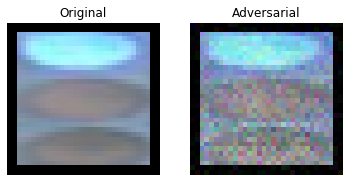

2


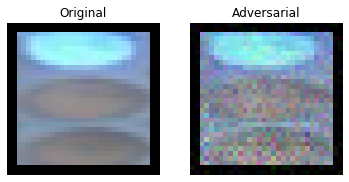

2


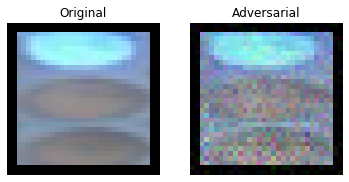

2


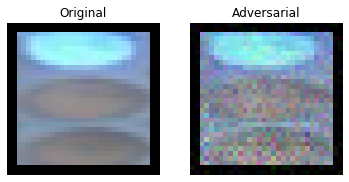

2


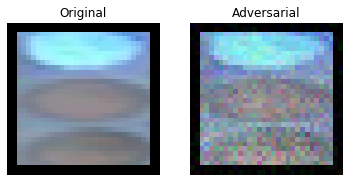

2


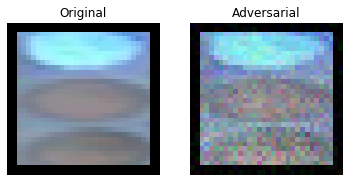

2


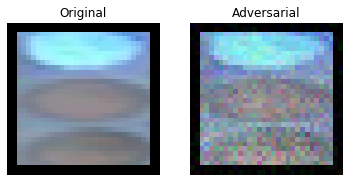

2


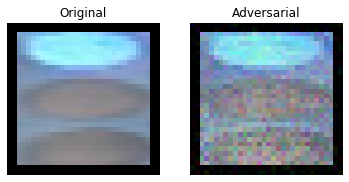

2


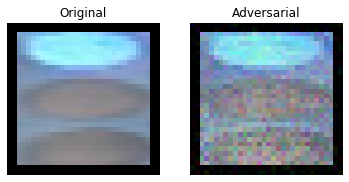

2


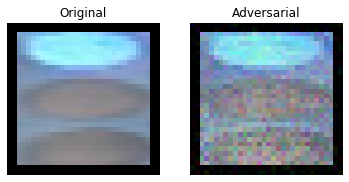

2


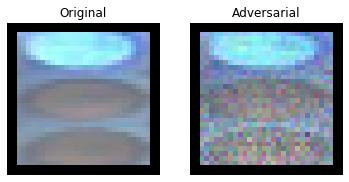

2


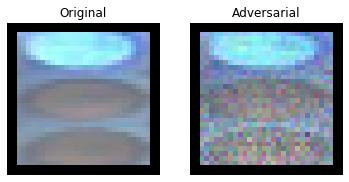

2


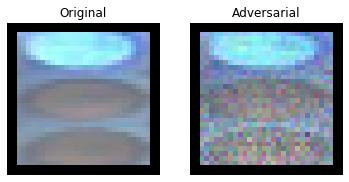

2


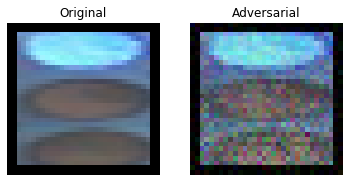

2


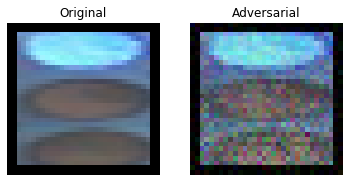

2


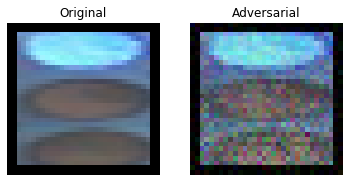

2


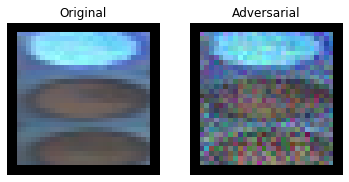

2


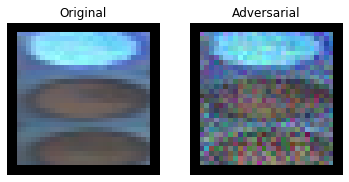

2


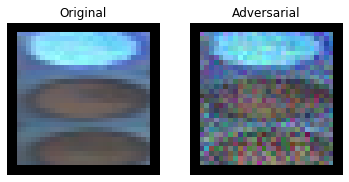

2


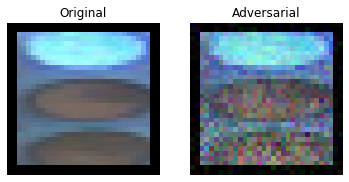

2


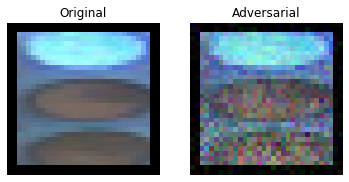

2


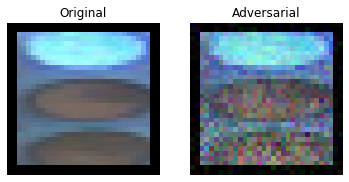

2


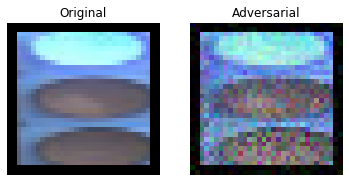

2


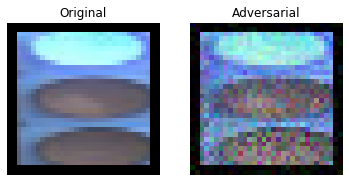

2


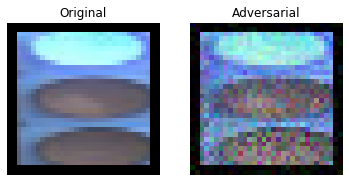

2


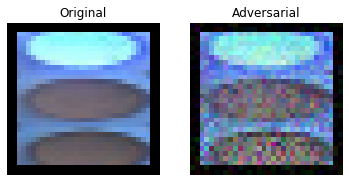

2


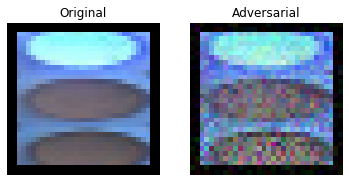

2


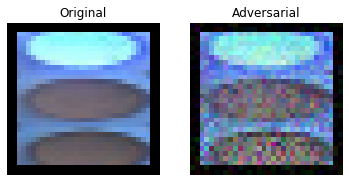

2


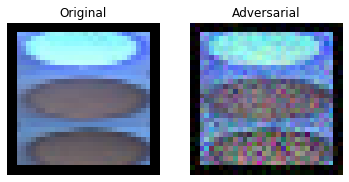

2


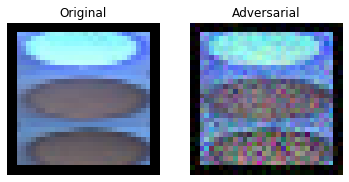

2


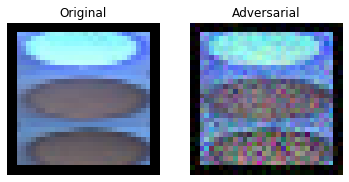

2


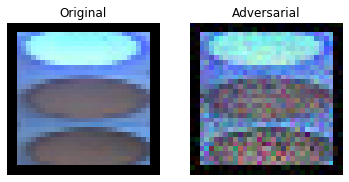

2


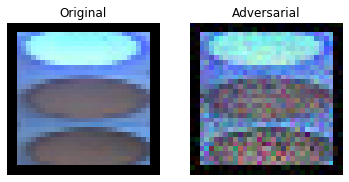

2


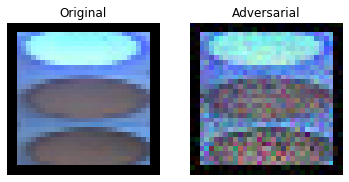

2


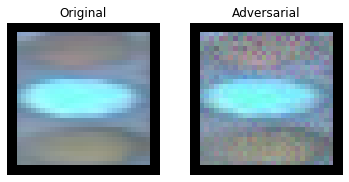

1


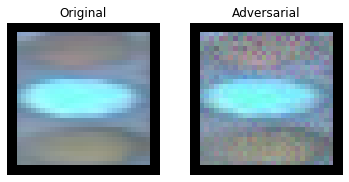

1


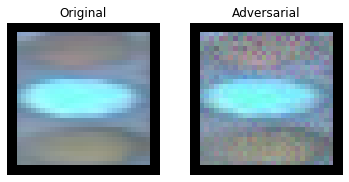

1


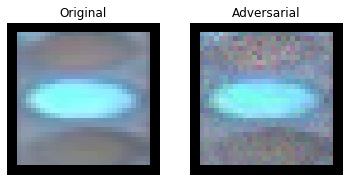

1


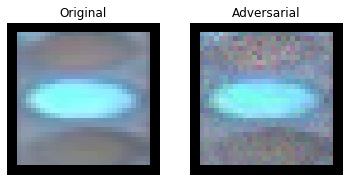

1


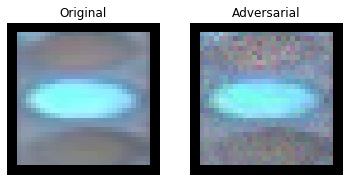

1


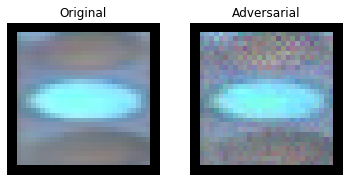

1


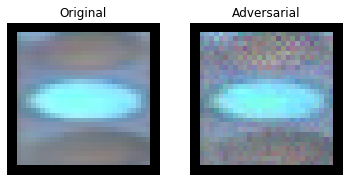

1


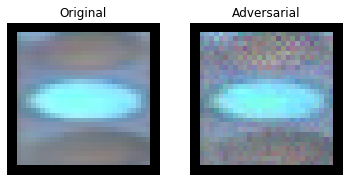

1


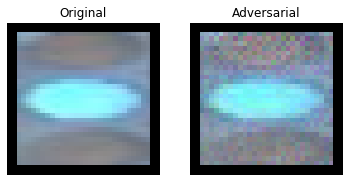

1


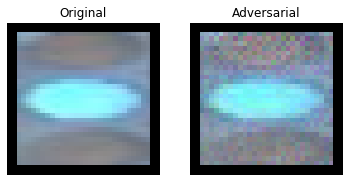

1


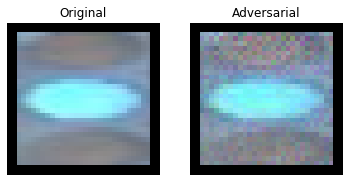

1


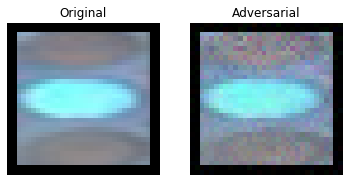

1


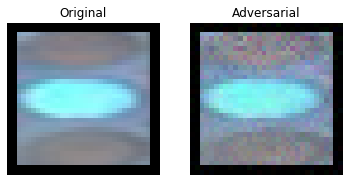

1


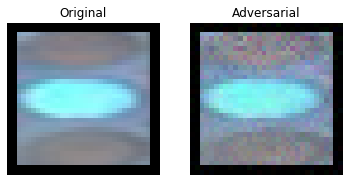

1


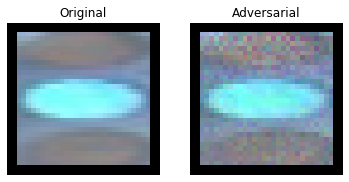

1


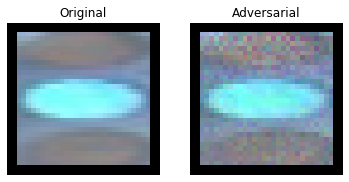

1


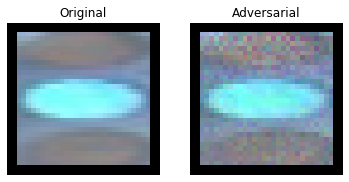

1


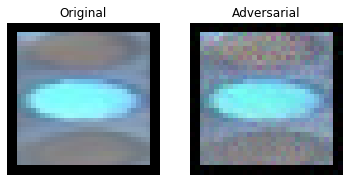

1


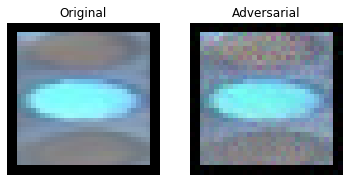

1


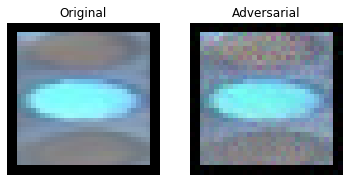

1


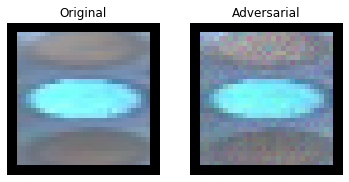

1


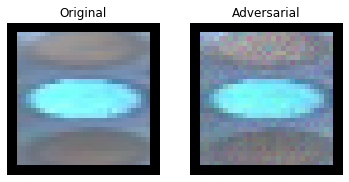

1


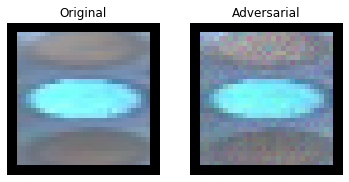

1


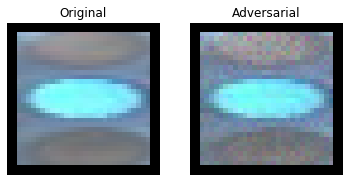

1


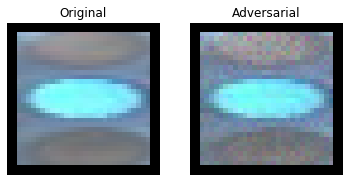

1


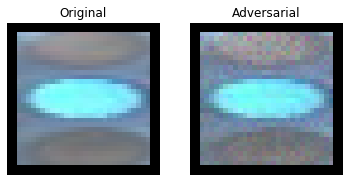

1


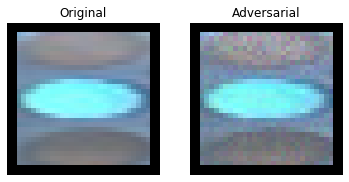

1


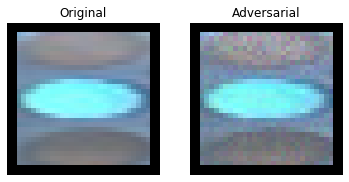

1


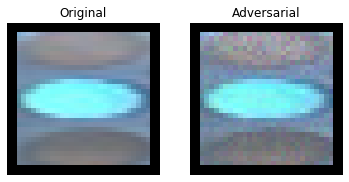

1


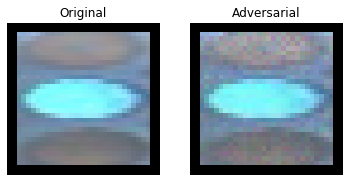

1


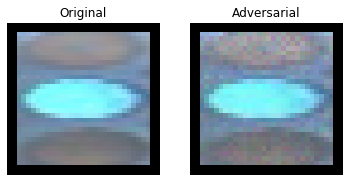

1


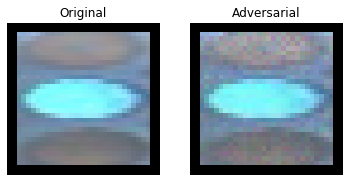

1


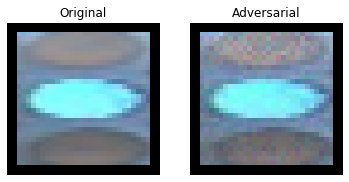

1


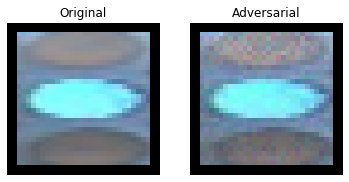

1


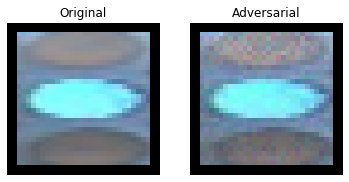

1


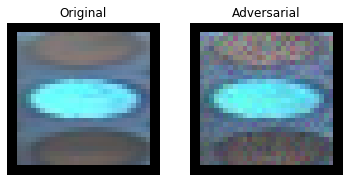

1


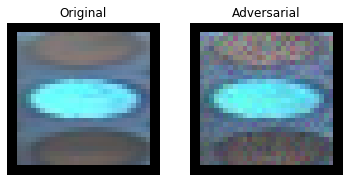

1


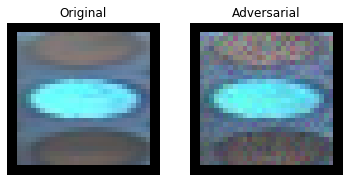

1


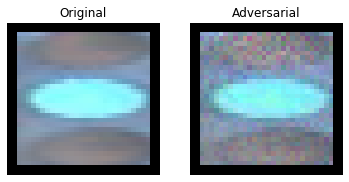

1


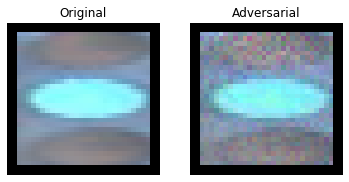

1


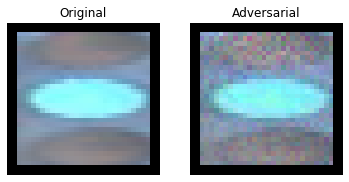

1


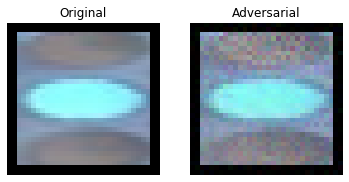

1


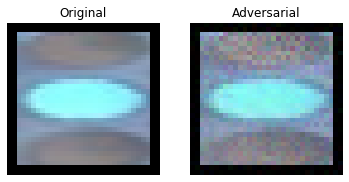

1


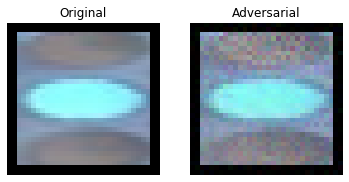

1


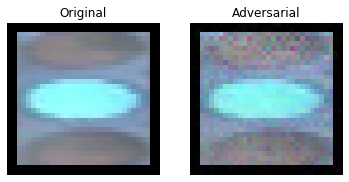

1


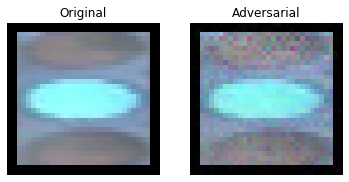

1


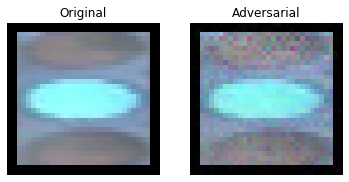

1


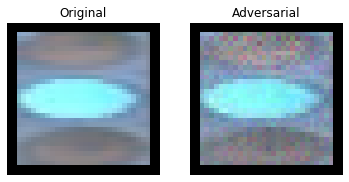

1


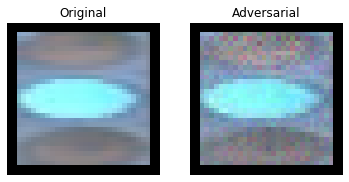

1


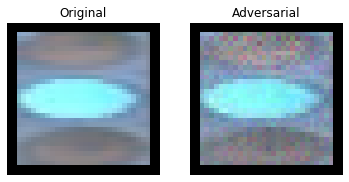

1


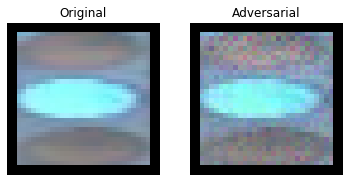

1


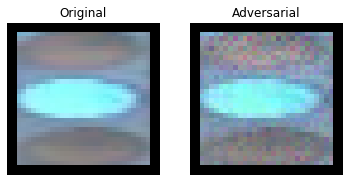

1


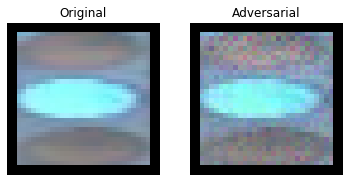

1


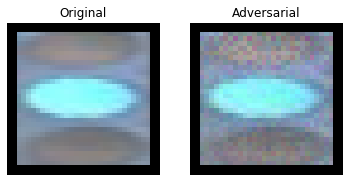

1


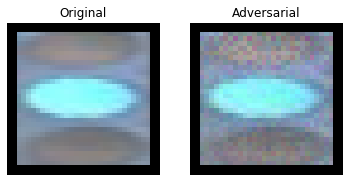

1


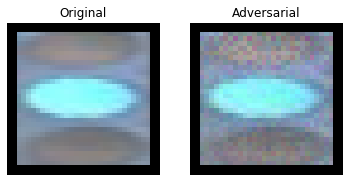

1


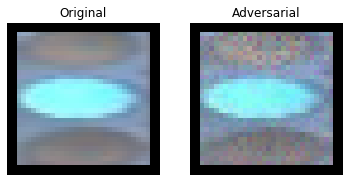

1


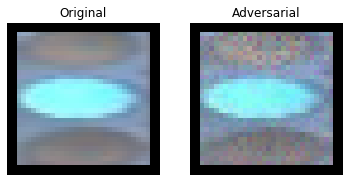

1


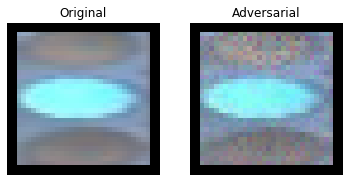

1


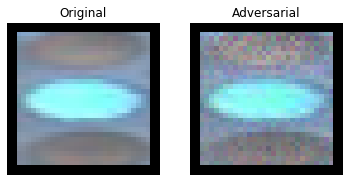

1


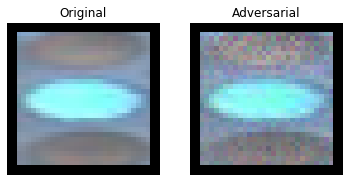

1


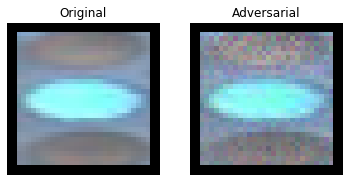

1


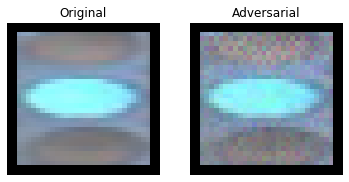

1


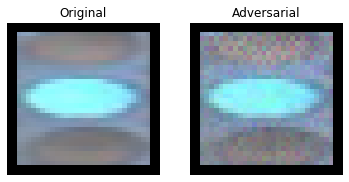

1


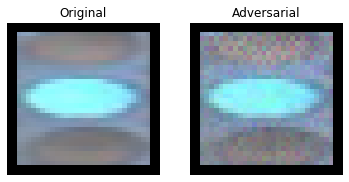

1


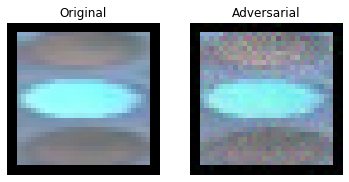

1


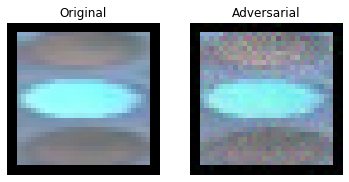

1


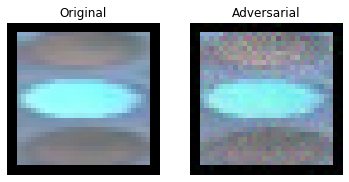

1


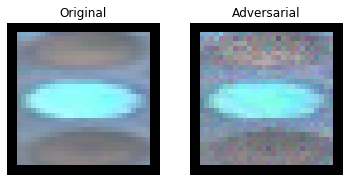

1


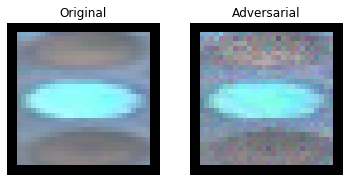

1


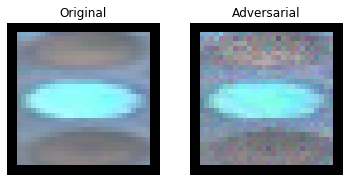

1


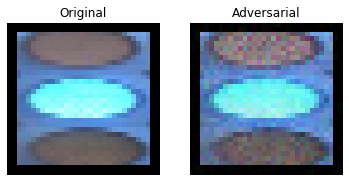

1


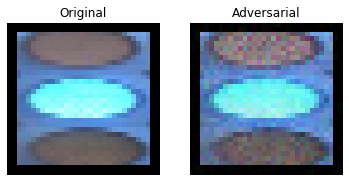

1


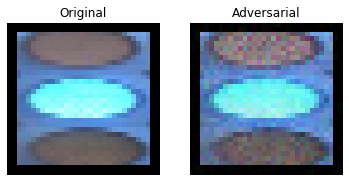

1


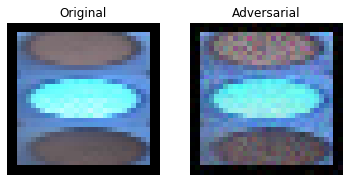

1


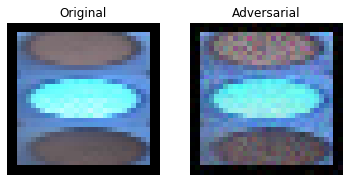

1


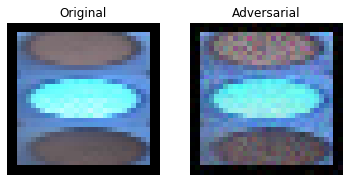

1


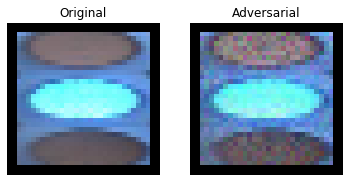

1


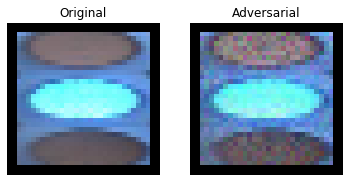

1


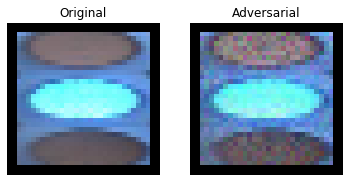

1


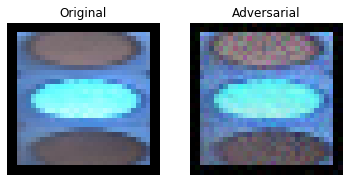

1


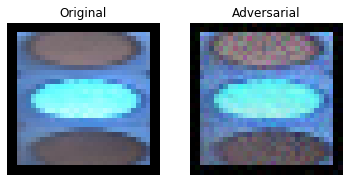

1


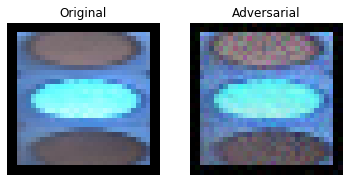

1


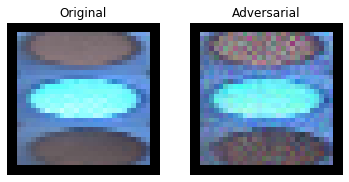

1


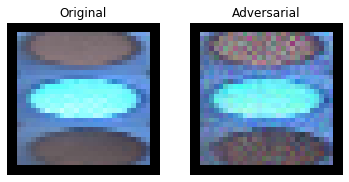

1


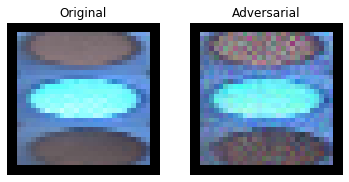

1


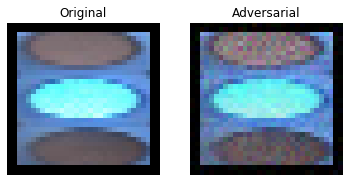

1


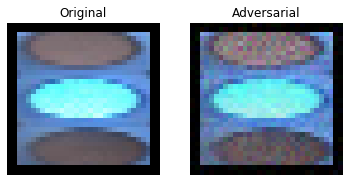

1


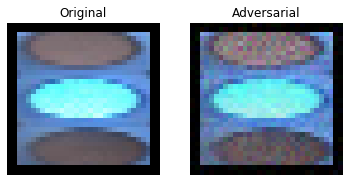

1


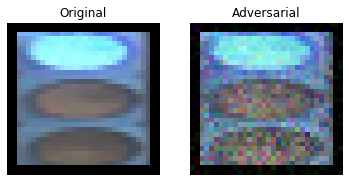

2


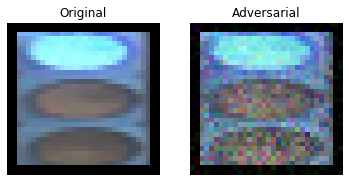

2


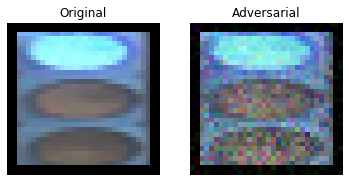

2


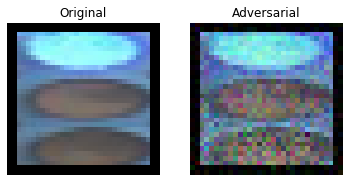

2


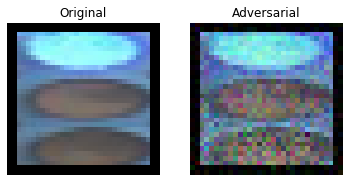

2


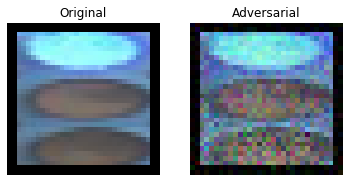

2


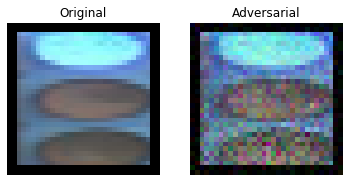

2


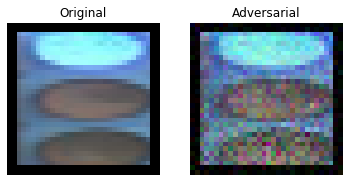

2


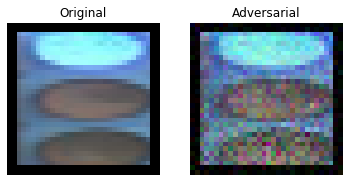

2


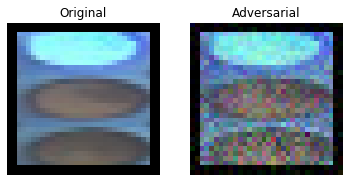

2


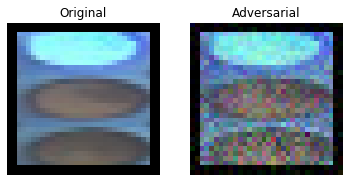

2


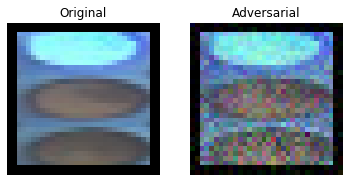

2


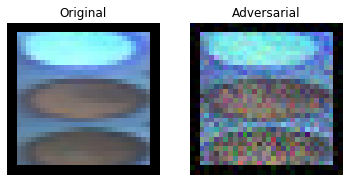

2


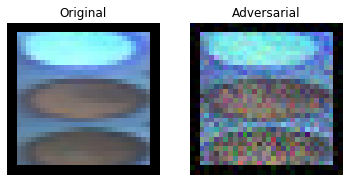

2


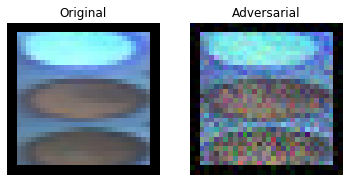

2


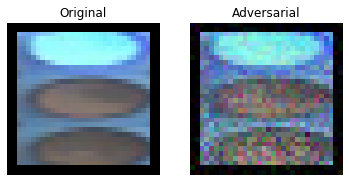

2


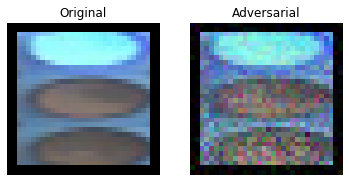

2


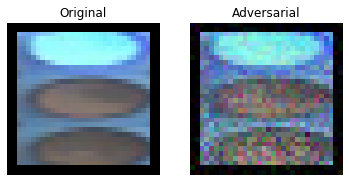

2


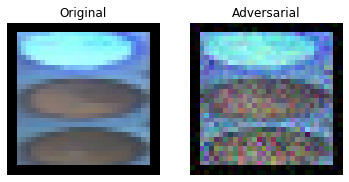

2


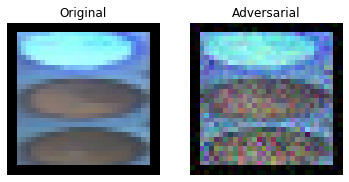

2


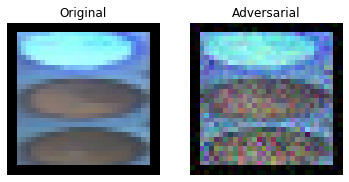

2


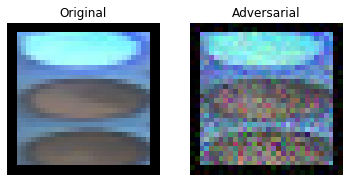

2


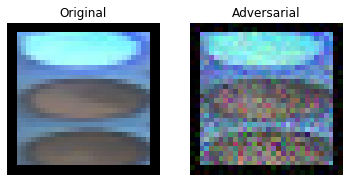

2


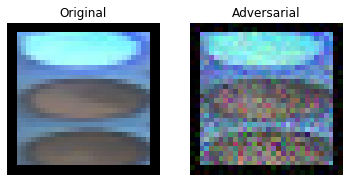

2


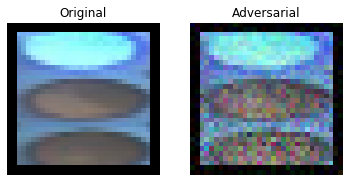

2


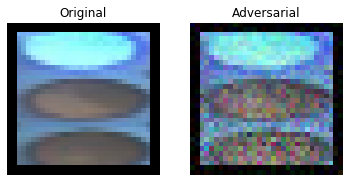

2


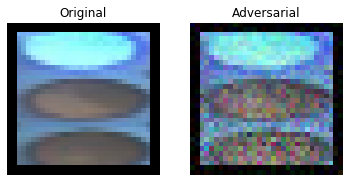

2


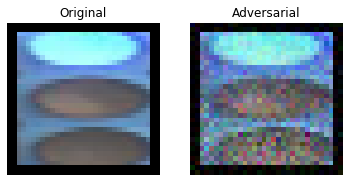

2


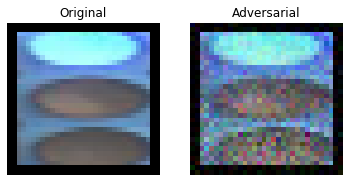

2


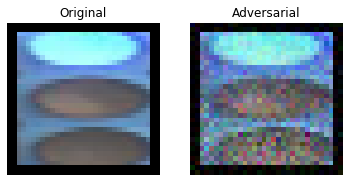

2


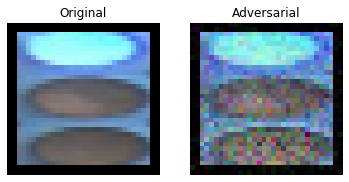

2


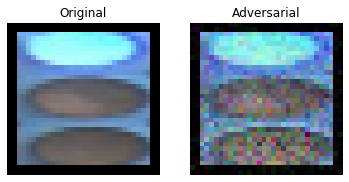

2


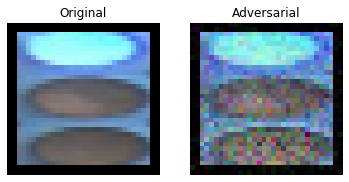

2


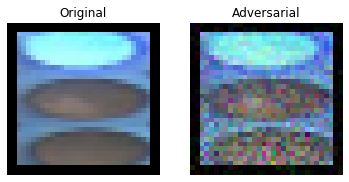

2


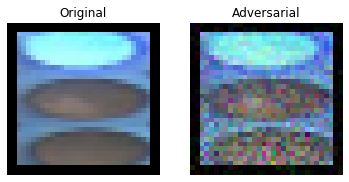

2


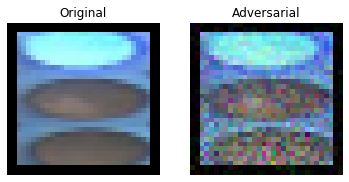

2


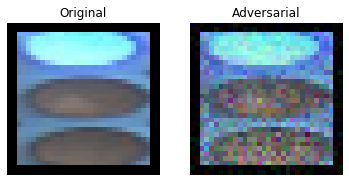

2


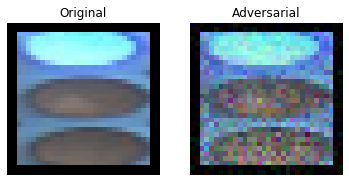

2


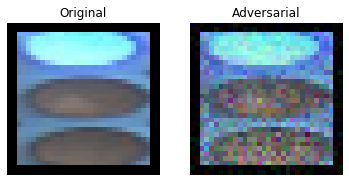

2


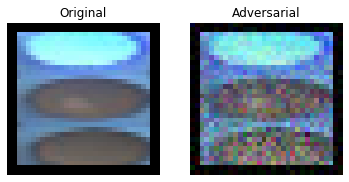

2


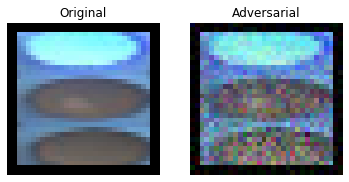

2


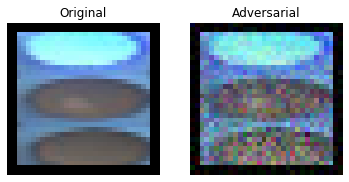

2


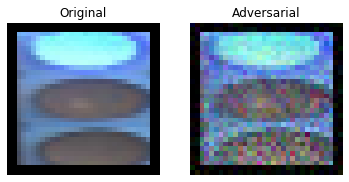

2


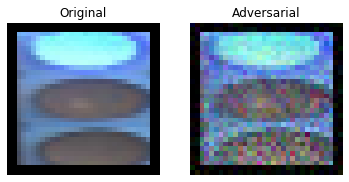

2


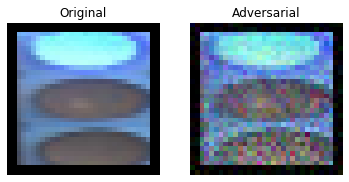

2


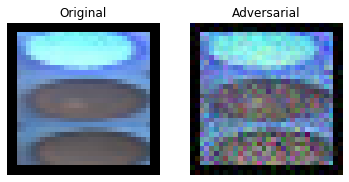

2


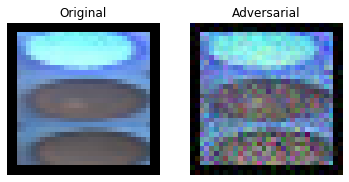

2


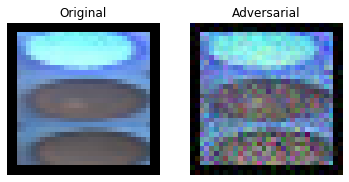

2


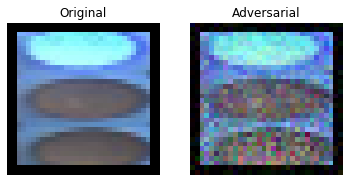

2


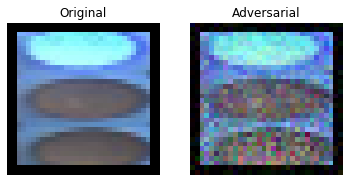

2


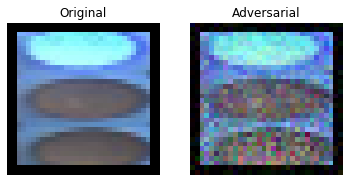

2


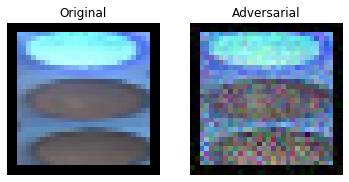

2


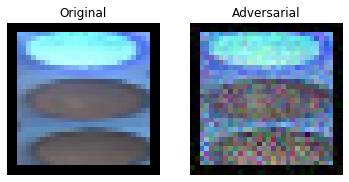

2


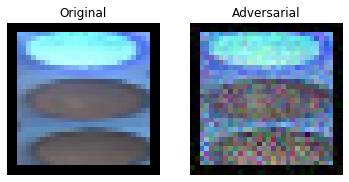

2


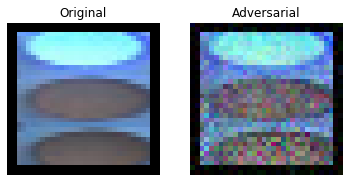

2


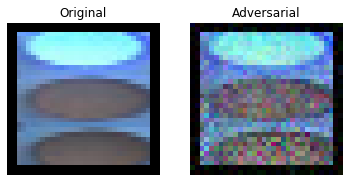

2


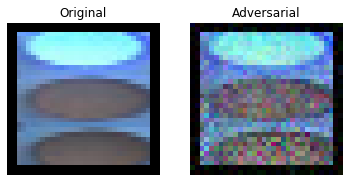

2


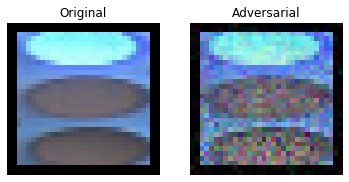

2


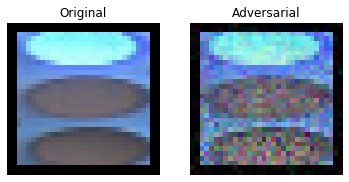

2


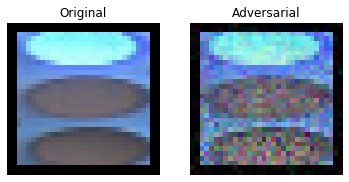

2


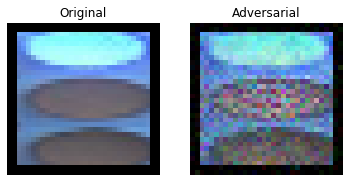

2


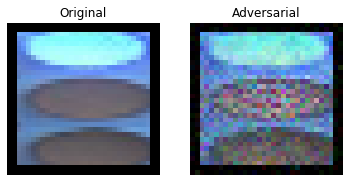

2


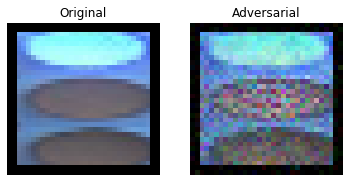

2


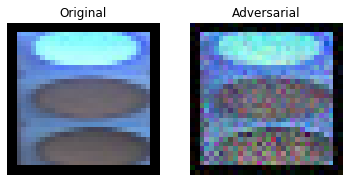

2


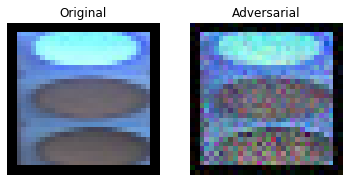

2


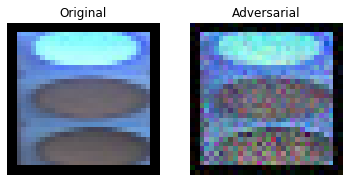

2


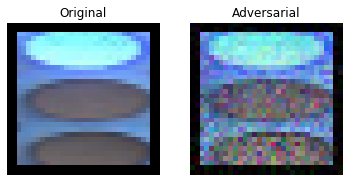

2


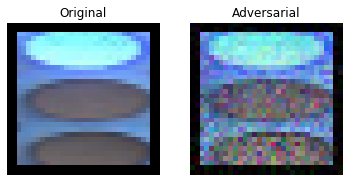

2


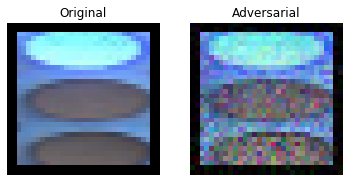

2


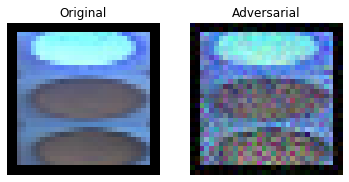

2


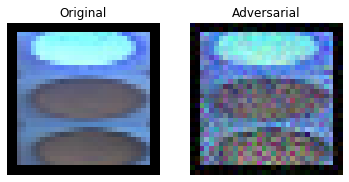

2


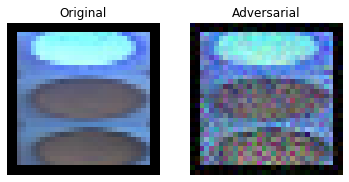

2


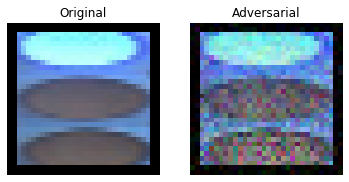

2


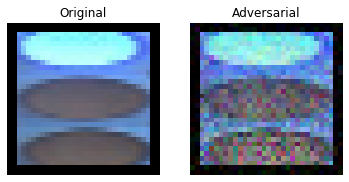

2


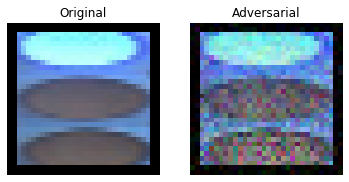

2


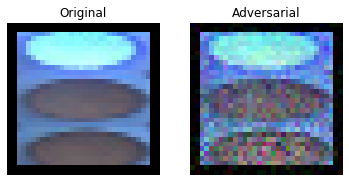

2


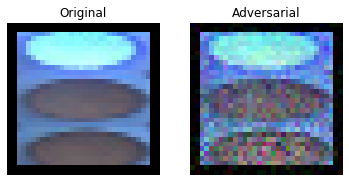

2


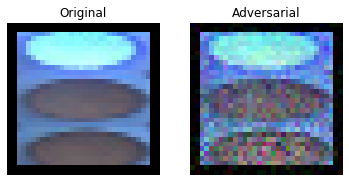

2


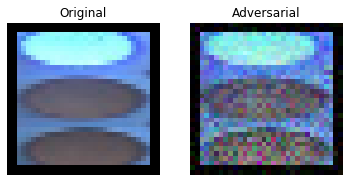

2


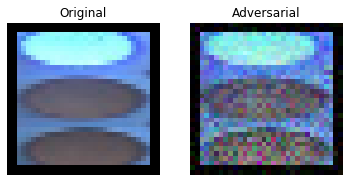

2


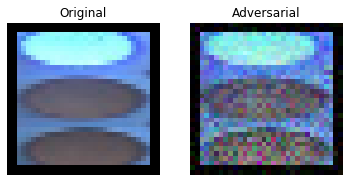

2


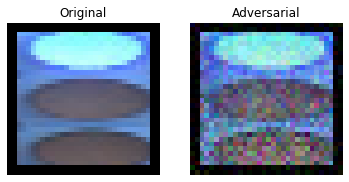

2


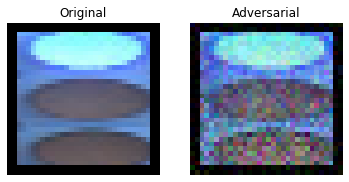

2


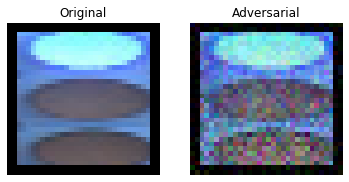

2


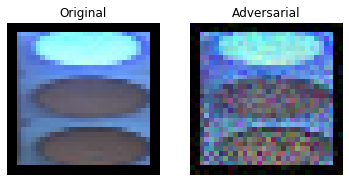

2


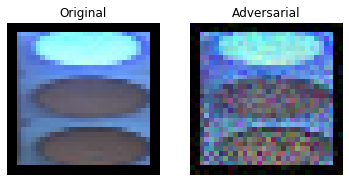

2


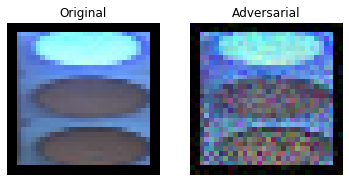

2


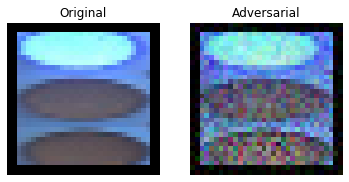

2


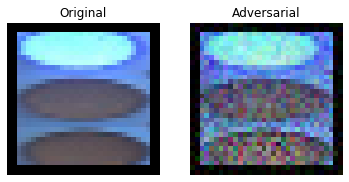

2


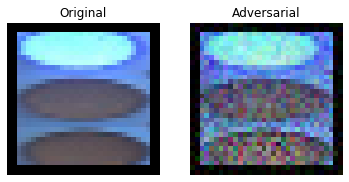

2


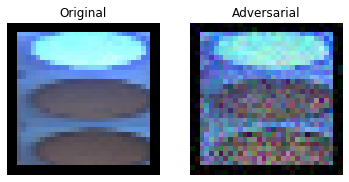

2


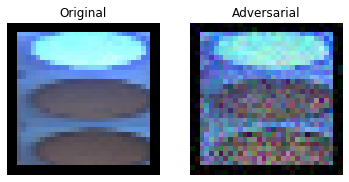

2


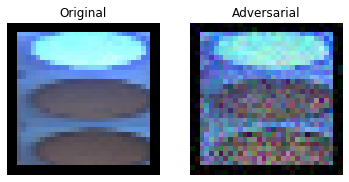

2


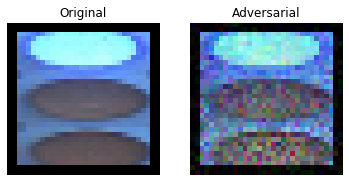

2


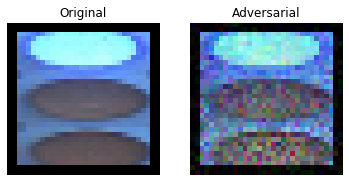

2


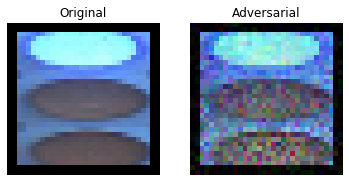

2


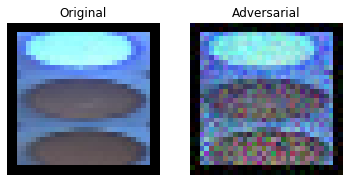

2


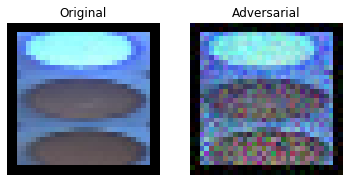

2


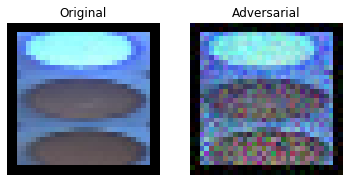

2


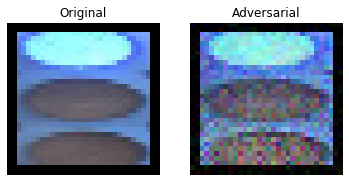

2


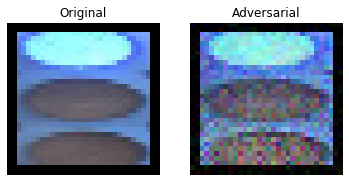

2


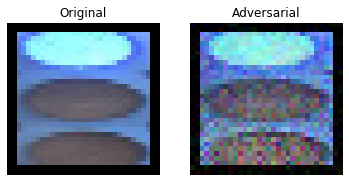

2


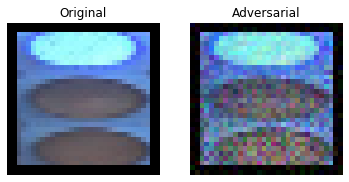

2


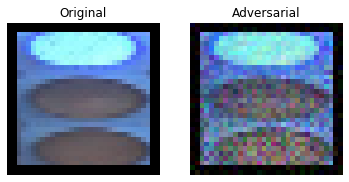

2


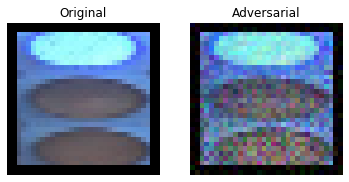

2


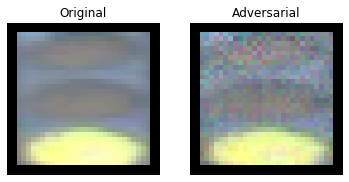

0


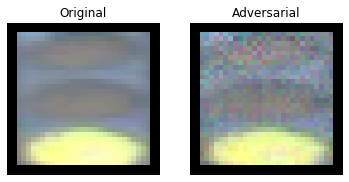

0


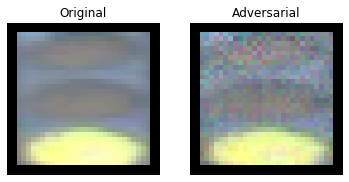

0


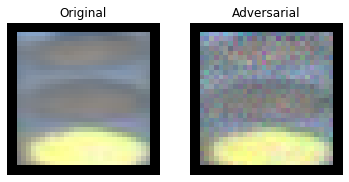

0


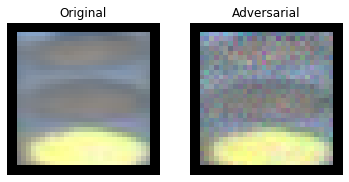

0


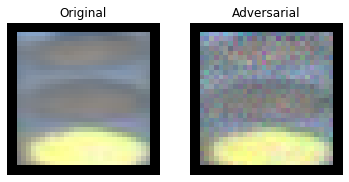

0


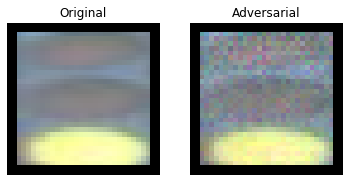

0


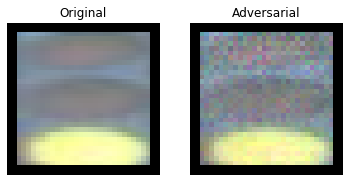

0


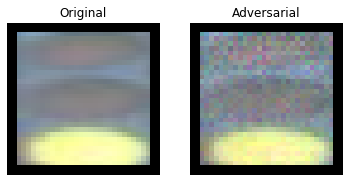

0


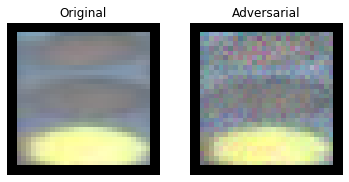

0


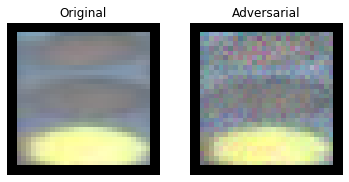

0


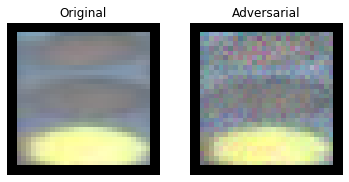

0


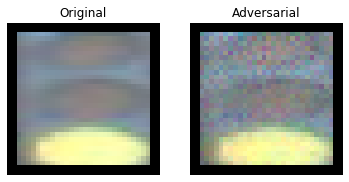

0


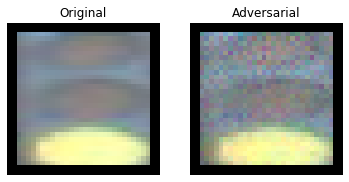

0


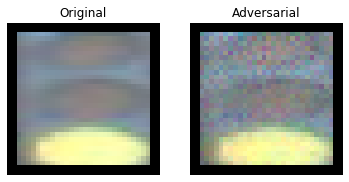

0


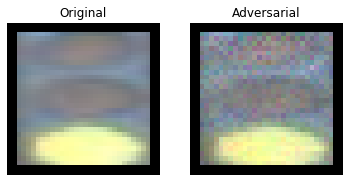

0


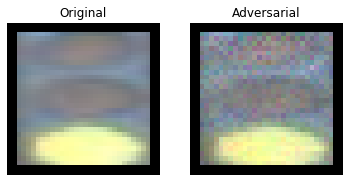

0


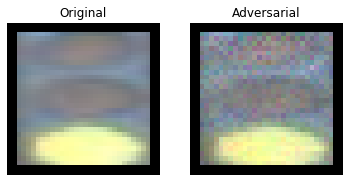

0


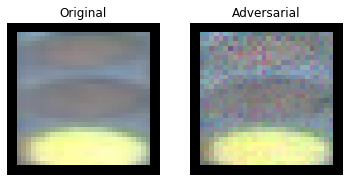

0


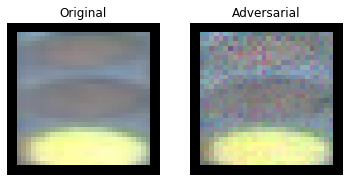

0


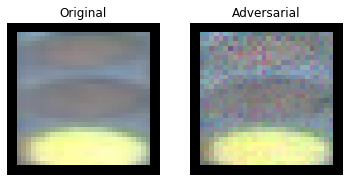

0


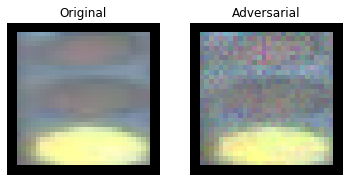

0


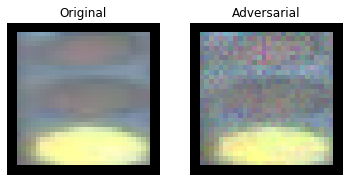

0


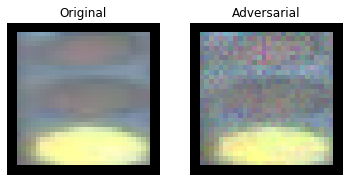

0


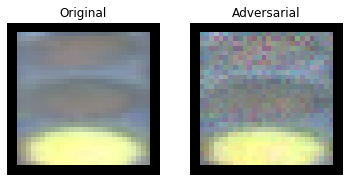

0


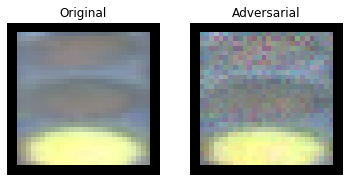

0


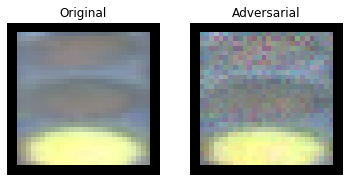

0


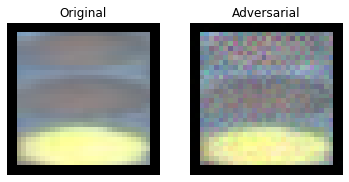

0


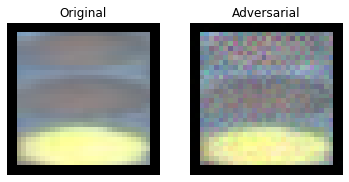

0


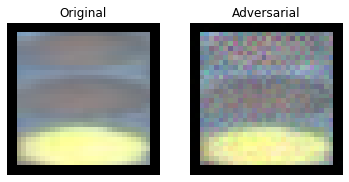

0


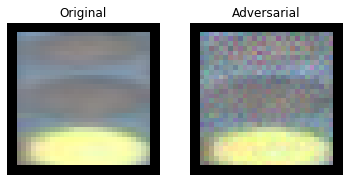

0


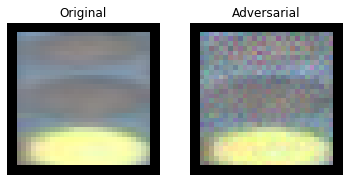

0


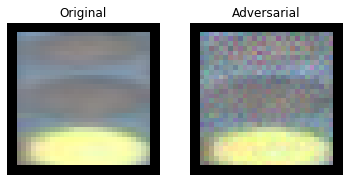

0


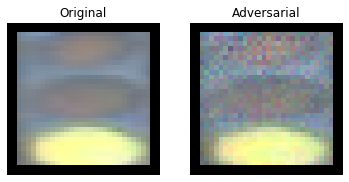

0


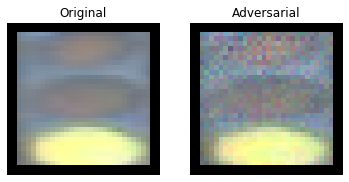

0


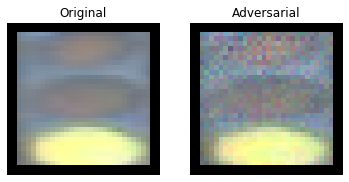

0


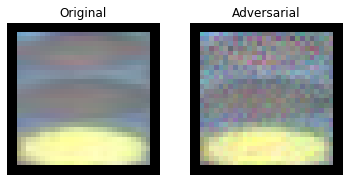

0


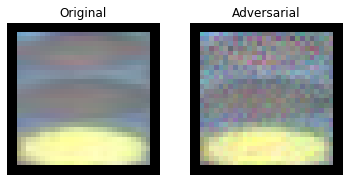

0


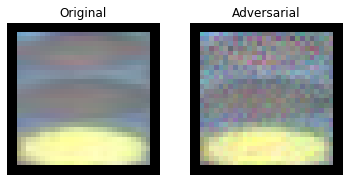

0


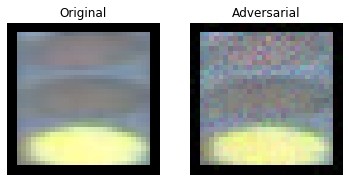

0


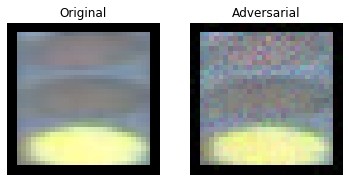

0


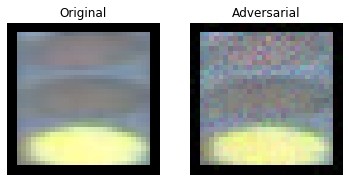

0


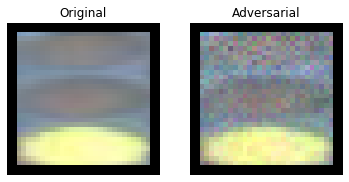

0


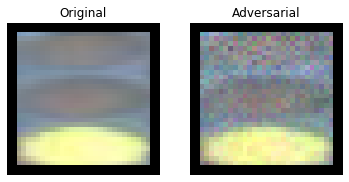

0


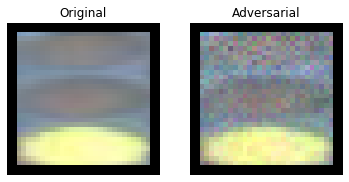

0


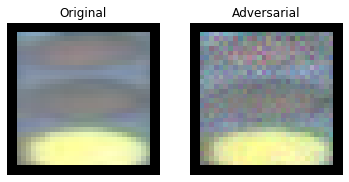

0


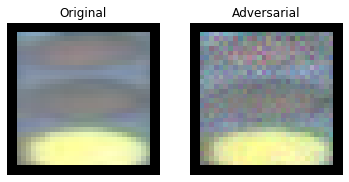

0


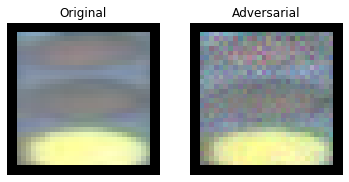

0


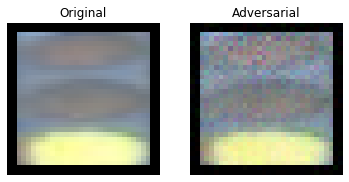

0


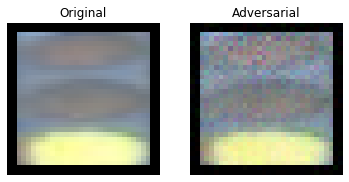

0


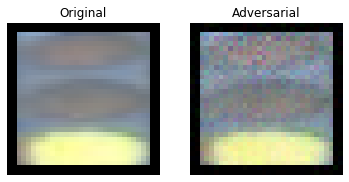

0


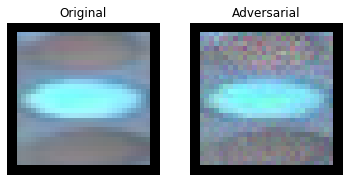

1


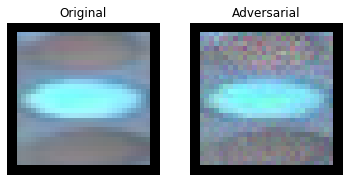

1


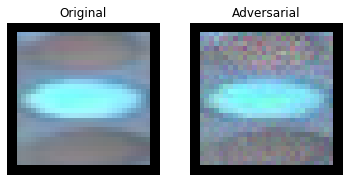

1


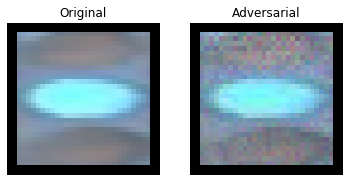

1


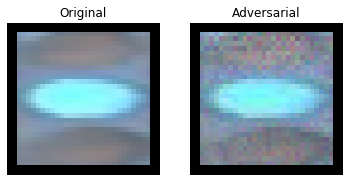

1


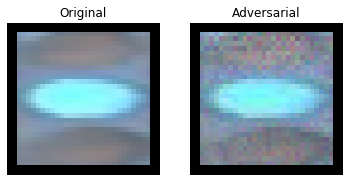

1


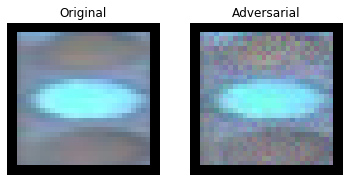

1


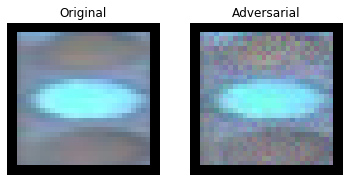

1


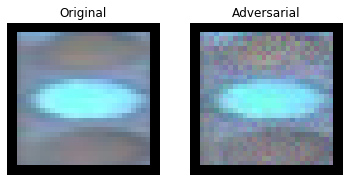

1


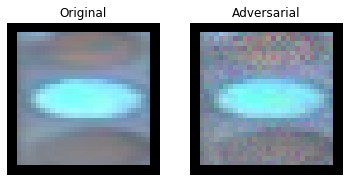

1


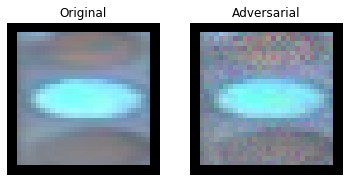

1


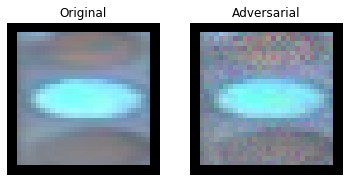

1


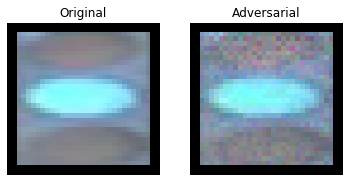

1


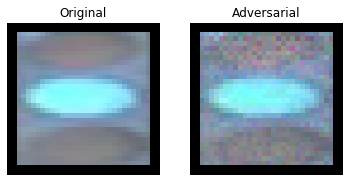

1


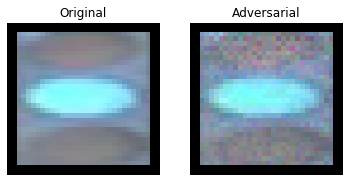

1


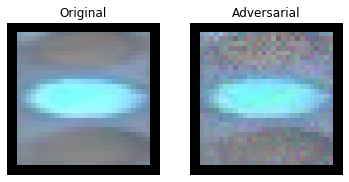

1


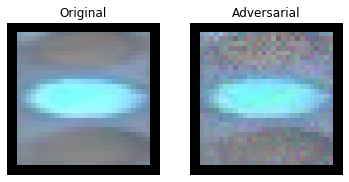

1


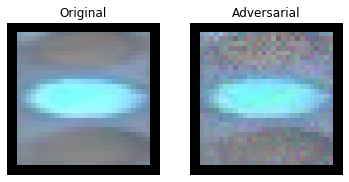

1


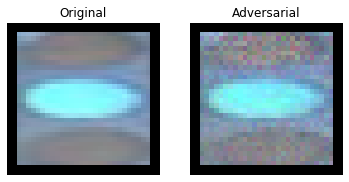

1


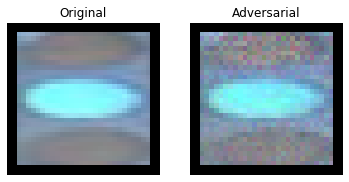

1


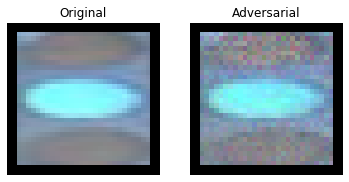

1


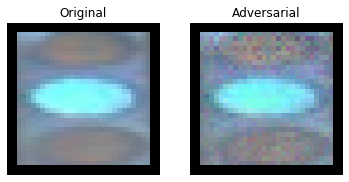

1


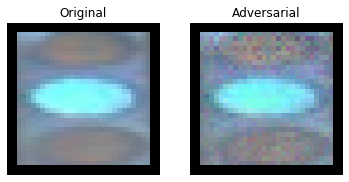

1


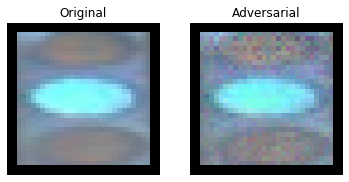

1


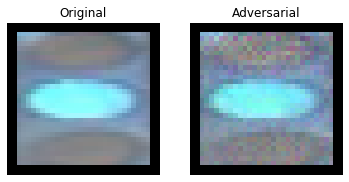

1


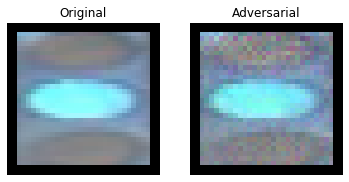

1


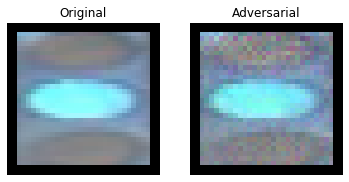

1


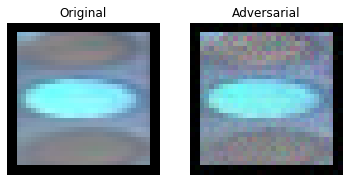

1


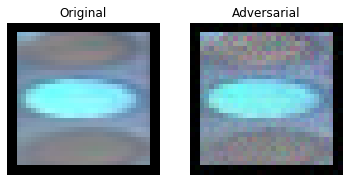

1


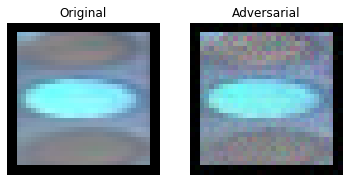

1


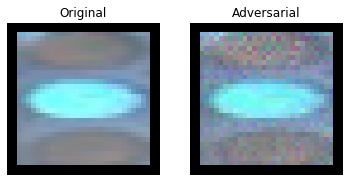

1


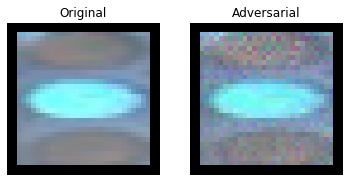

1


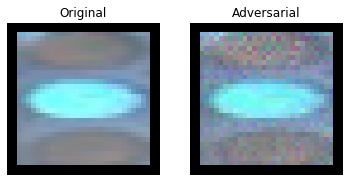

1


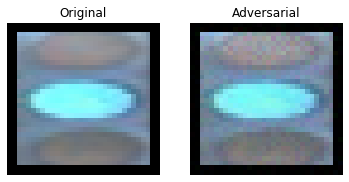

1


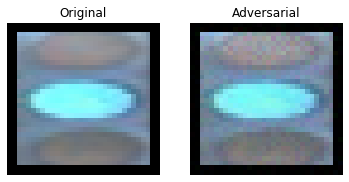

1


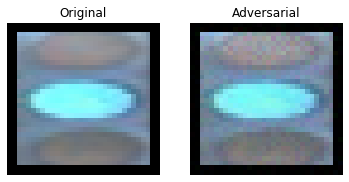

1


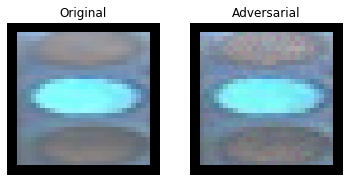

1


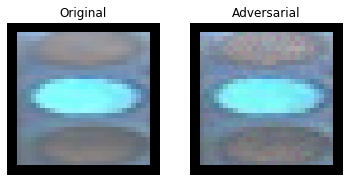

1


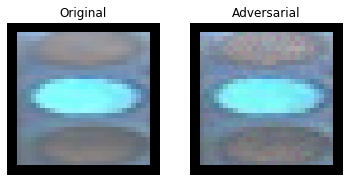

1


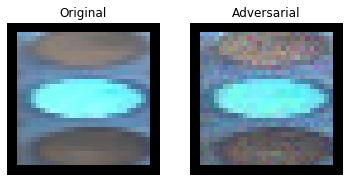

1


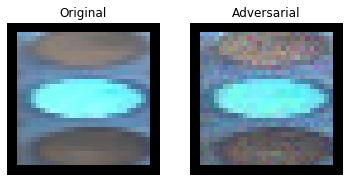

1


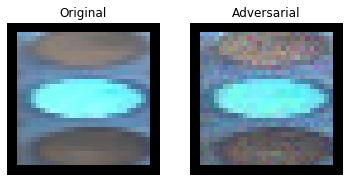

1


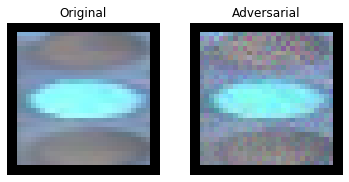

1


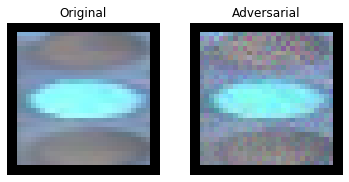

1


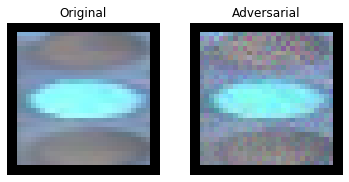

1


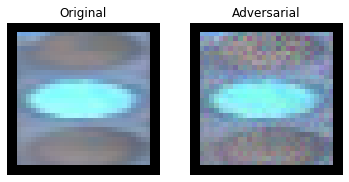

1


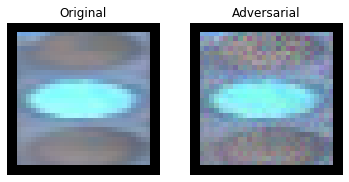

1


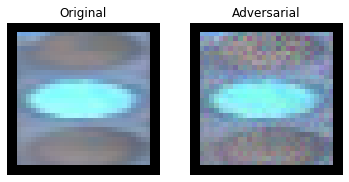

1


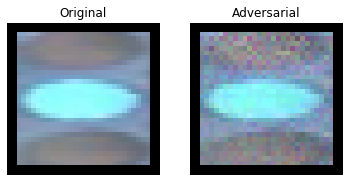

1


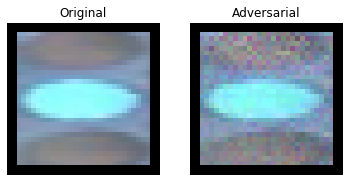

1


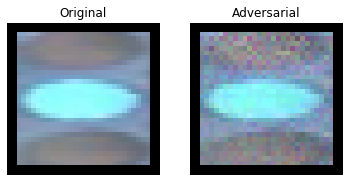

1


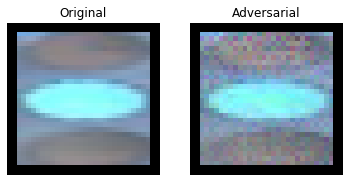

1


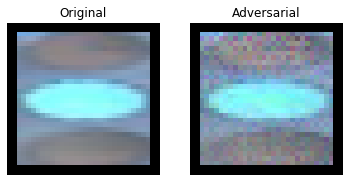

1


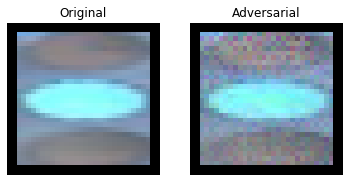

1
1212
1212


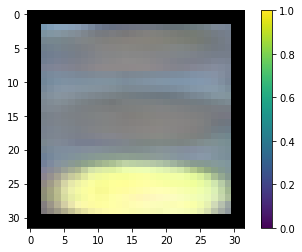

In [0]:
k = 0
while k < len(adversarial2):
  if np.isnan(adversarial2[k][0][0][0]) == False:
    Adversarial_X.append(adversarial2[k])
    Adversarial_Y.append(Y[k])
    plt.figure()

    plt.subplot(1, 2, 1)
    plt.title('Original')
    plt.imshow(X[k])  # division by 255 to convert [0, 255] to [0, 1]
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Adversarial')
    plt.imshow(adversarial2[k])  # ::-1 to convert BGR to RGB
    plt.axis('off')


    plt.show()
    print(Y[k])
  k += 1
print(len(Adversarial_X))
print(len(Adversarial_Y))
plt.figure()
plt.imshow(Adversarial_X[0])
plt.colorbar()
plt.grid(False)
plt.show()

In [0]:
from sklearn.model_selection import StratifiedKFold
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.optimizers import SGD
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=seed)
results_list = []
for train, test in kfold.split(Adversarial_X, Adversarial_Y):
  robust_test_model = Sequential()
  robust_test_model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(32, 32, 3)))
  robust_test_model.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
  robust_test_model.add(MaxPooling2D((2, 2)))
  robust_test_model.add(Flatten())
  robust_test_model.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
  robust_test_model.add(Dense(3, activation = 'softmax'))
# compile model
  opt = SGD(lr=0.001, momentum=0.9)
  robust_test_model.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
  robust_test_model.fit(test_array_for_model(Adversarial_X)[train], np.array(Adversarial_Y)[train], epochs=3, batch_size=50)
  results = robust_test_model.evaluate(test_array_for_model(Adversarial_X)[test], np.array(Adversarial_Y)[test])
  results_list.append(results[1] * 100)

Epoch 1/3
1089/1089 [==============================] - 3s 3ms/step - loss: 0.3099 - acc: 0.9146
Epoch 2/3
1089/1089 [==============================] - 2s 2ms/step - loss: 0.0138 - acc: 1.0000
Epoch 3/3
123/123 [==============================] - 0s 3ms/step
Epoch 1/3
1089/1089 [==============================] - 3s 3ms/step - loss: 0.3177 - acc: 0.9366
Epoch 2/3
1089/1089 [==============================] - 2s 2ms/step - loss: 0.0083 - acc: 1.0000
Epoch 3/3
123/123 [==============================] - 0s 3ms/step
Epoch 1/3
1090/1090 [==============================] - 3s 3ms/step - loss: 0.6028 - acc: 0.7468
Epoch 2/3
1090/1090 [==============================] - 2s 2ms/step - loss: 0.0552 - acc: 0.9972
Epoch 3/3
122/122 [==============================] - 0s 3ms/step
Epoch 1/3
1091/1091 [==============================] - 3s 3ms/step - loss: 0.4342 - acc: 0.8323
Epoch 2/3
1091/1091 [==============================] - 2s 2ms/step - loss: 0.0148 - acc: 1.0000
Epoch 3/3
121/121 [==================

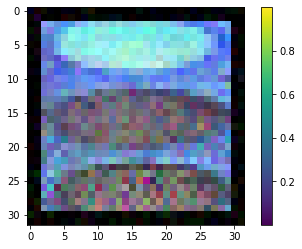

2


In [0]:
X_train_new, X_test_new, Y_train_new, Y_test_new = train_test_split(Adversarial_X, Adversarial_Y, test_size=0.33, random_state=seed)
X_train_new = np.array(X_train_new).reshape( -1, IMG_SIZE, IMG_SIZE, 3)
X_test_new = np.array(X_test_new).reshape( -1, IMG_SIZE, IMG_SIZE, 3)
plt.figure()
plt.imshow(X_train_new[150])
plt.colorbar()
plt.grid(False)
plt.show()
print(Y_train_new[150])

In [0]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Flatten, Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.optimizers import SGD
robustkmodel = Sequential()
robustkmodel.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same', input_shape=(32, 32, 3)))
robustkmodel.add(Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_uniform', padding='same'))
robustkmodel.add(MaxPooling2D((2, 2)))
robustkmodel.add(Flatten())
robustkmodel.add(Dense(128, activation='relu', kernel_initializer='he_uniform'))
robustkmodel.add(Dense(3, activation = 'softmax'))
# compile model
opt = SGD(lr=0.001, momentum=0.9)
robustkmodel.compile(optimizer=opt, loss='sparse_categorical_crossentropy', metrics=['accuracy'])
robustkmodel.fit(X_train_new, Y_train_new,batch_size=50,epochs=3, validation_split = 0.3)
robustkmodel.evaluate(X_test_new, Y_test_new)

Train on 567 samples, validate on 243 samples
Epoch 1/3
567/567 [==============================] - 2s 3ms/step - loss: 1.3567 - acc: 0.5326 - val_loss: 0.4157 - val_acc: 0.8066
Epoch 2/3
567/567 [==============================] - 1s 2ms/step - loss: 0.1924 - acc: 0.9436 - val_loss: 0.0932 - val_acc: 0.9918
Epoch 3/3
399/399 [==============================] - 0s 484us/step


[0.030910212135778034, 0.9974937343358395]

In [0]:
print(len(X_test_new))
print(len(Y_test_new))

400
400


In [0]:
robustfmodel = foolbox.models.KerasModel(robust_test_model, bounds=(0, 1), preprocessing=(0,1))
attack = foolbox.attacks.SpatialAttack(robustfmodel)
adversarial3 = attack(test_array_for_model(X_test_new), np.array(Y_test_new), x_shift_limits = (-3,3), y_shift_limits = (-3,3))

/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:95: UserWarning: SpatialAttack did not find an adversarial, maybe the model or the criterion is not supported by this attack.
  " attack.".format(self.name())


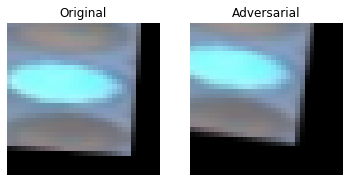

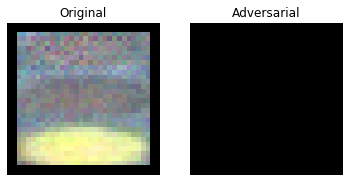

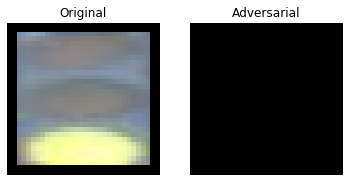

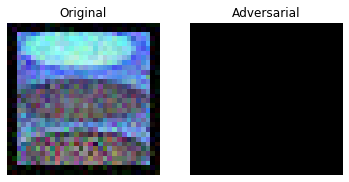

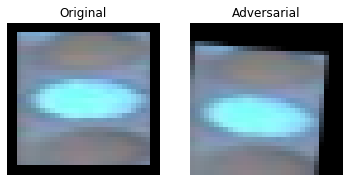

...

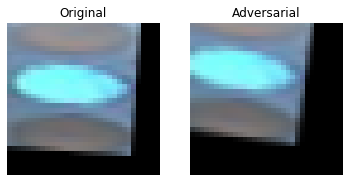

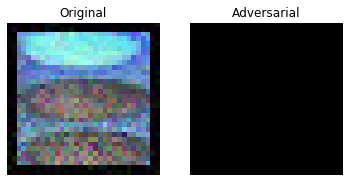

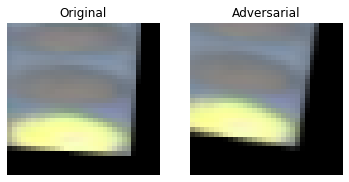

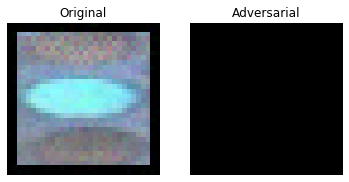

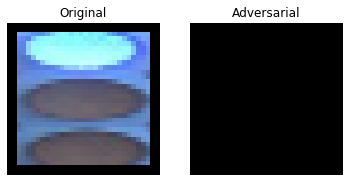

In [0]:
count = 0
count2 = 0
while count < len(adversarial3):
  if 
  plt.figure()

  plt.subplot(1, 2, 1)
  plt.title('Original')
  plt.imshow(X_test_new[count])  # division by 255 to convert [0, 255] to [0, 1]
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.title('Adversarial')
  plt.imshow(adversarial3[count])  # ::-1 to convert BGR to RGB
  plt.axis('off')


  plt.show()
  count += 1

In [0]:
print(adversarial[1][0][0][0])

nan


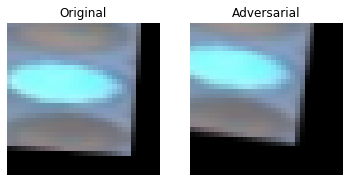

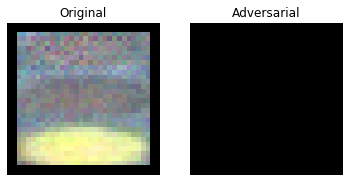

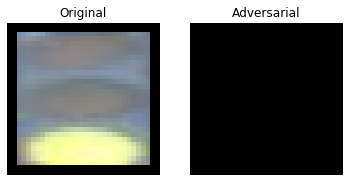

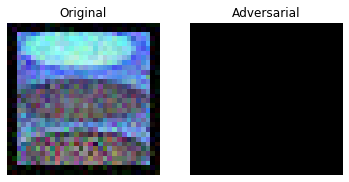

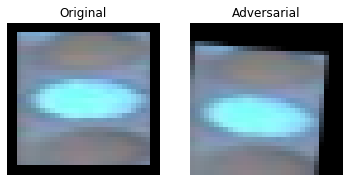

...

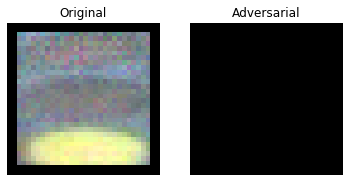

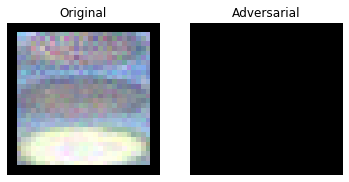

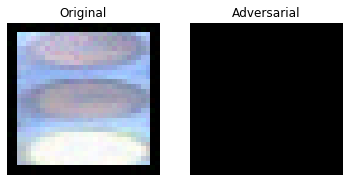

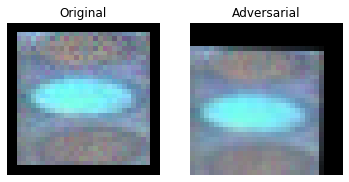

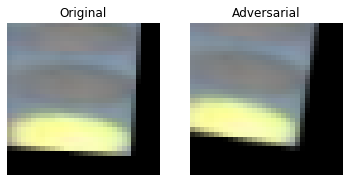

In [0]:
count = 0
count2 = 0
while count < len(adversarial):
  plt.figure()

  plt.subplot(1, 2, 1)
  plt.title('Original')
  plt.imshow(X_test_new[count])  # division by 255 to convert [0, 255] to [0, 1]
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.title('Adversarial')
  plt.imshow(adversarial[count])  # ::-1 to convert BGR to RGB
  plt.axis('off')


  plt.show()
  count += 1

In [0]:
count3 = 0
count4 = 0
while count3 < len(adversarial):
  if np.isnan(adversarial[count3][0][0][0]) == False:
    count4 += 1
    print(count4)
    
  count3 += 1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254


In [0]:
print(len(adversarial))

400


In [0]:
robustfmodel = foolbox.models.KerasModel(robust_test_model, bounds=(0, 1), preprocessing=(0,1))
attack = foolbox.attacks.CarliniWagnerL2Attack(robustfmodel)
adversarial = attack(test_array_for_model(X_test_new), np.array(Y_test_new))

In [0]:
count3 = 0
count4 = 0
while count3 < len(adversarial):
  if np.isnan(adversarial[count3][0][0][0]) == False:
    count4 += 1
    print(count4)
    
  count3 += 1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [0]:
count5 = 0
count6 = 0
while count5 < len(adversarial):
  if np.isnan(adversarial[count5][0][0][0]) == False:
    count6 += 1
    print(count6)
    
  count5 += 1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
